# Compare different atlases
### By: Linjing Jiang
### Date: 3/18/24

    IMPORTANT: Before running this script, make sure that you have parsed out the ROIs from the following atlas: aal, HCP, jubrain, and VisualProbAtlas_V4. They should be inside the '/mnt/Data1/linjdata1/vswmda/atlases' folder. Each folder contains original atlas as well as scripts for parsing out these atlases.
    
    Scripts: 'rip_apart_xxx.m' - store different ROIs as separate masks under 'separate_masks' subfolder
    'reslice_roi_xxx.m' - reslice the images into the desired template.
    
    Resliced ROIs are stored in the 'separate_masks' subfolder and named as '2mm_ROIname.nii', as our desired template is 2mm MNI space. 
    
    Those resliced ROIs are the inputs to this current script.
    
    This script will output final atlas rois inside the 'final_atlas_roi' folder. 


In [1]:
import os
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

#from bids import BIDSLayout
import numpy as np
from nilearn import datasets, image, plotting, surface, maskers, masking
import nibabel as nib
import pandas as pd
import scipy.io as spio
from nilearn.masking import apply_mask
import scipy
import copy
import gzip
import shutil
import pickle
from distinctipy import distinctipy

#from atlasreader import create_output
#for inline visualization in jupyter notebook
%matplotlib inline

In [2]:
os.chdir('/mnt/Data1/linjdata1/vswmda/')

FileNotFoundError: [Errno 2] No such file or directory: '/mnt/Data1/linjdata1/vswmda/'

In [ ]:
# load template t1w image for plotting
tpl_t1w = nib.load('atlases/MNI152NLin2009cAsym/tpl-MNI152NLin2009cAsym_res-02_T1w.nii')

# V1

In [320]:
# load roi from jubrain atlas
v1_lh_ju = nib.load('atlases/jubrain/separate_masks/2mm_Area hOc1 (V1, 17, CalcS) left_prob50.nii')
v1_rh_ju = nib.load('atlases/jubrain/separate_masks/2mm_Area hOc1 (V1, 17, CalcS) right_prob50.nii')
v1_ju = image.math_img("img1 + img2", img1=v1_lh_ju, img2=v1_rh_ju)

In [321]:
# load roi from hcp atlas
v1_lh_hcp = nib.load('atlases/HCP/separate_masks/2mm_V1_L.nii')
v1_rh_hcp = nib.load('atlases/HCP/separate_masks/2mm_V1_R.nii')
v1_hcp = image.math_img("img1 + img2", img1=v1_lh_hcp, img2=v1_rh_hcp)

In [322]:
# load roi from AAL atlas
v1_lh_aal = nib.load('atlases/aal/separate_masks/2mm_Calcarine_L.nii')
v1_rh_aal = nib.load('atlases/aal/separate_masks/2mm_Calcarine_R.nii')
v1_aal = image.math_img("img1 + img2", img1=v1_lh_aal, img2=v1_rh_aal)

In [390]:
# load roi from wang atlas
v1v_lh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_V1v_lh_prob25.nii')
v1d_lh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_V1d_lh_prob25.nii')
v1v_rh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_V1v_rh_prob25.nii')
v1d_rh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_V1d_rh_prob25.nii')

# we want to combine v1v and v1d for the wang atlas
v1_lh_wang = image.math_img("img1 + img2", img1=v1v_lh_wang,img2=v1d_lh_wang)
v1_rh_wang = image.math_img("img1 + img2", img1=v1v_rh_wang,img2=v1d_rh_wang)
v1_wang = image.math_img("img1 + img2", img1=v1_lh_wang, img2=v1_rh_wang)


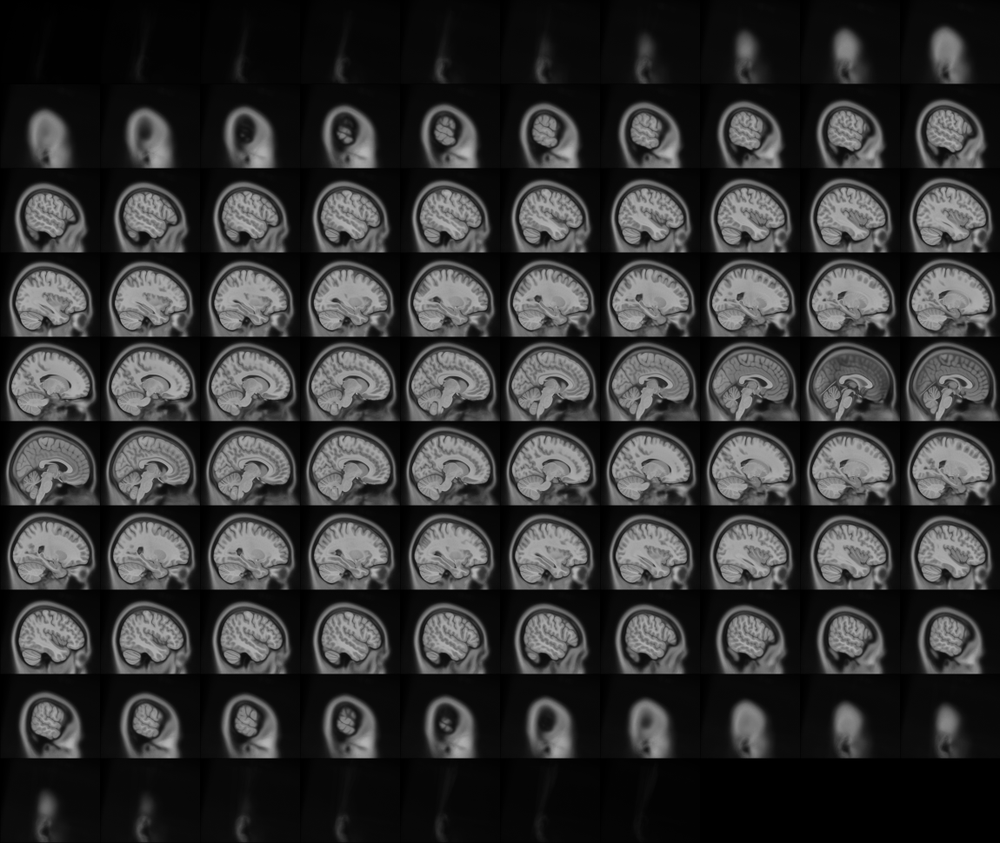
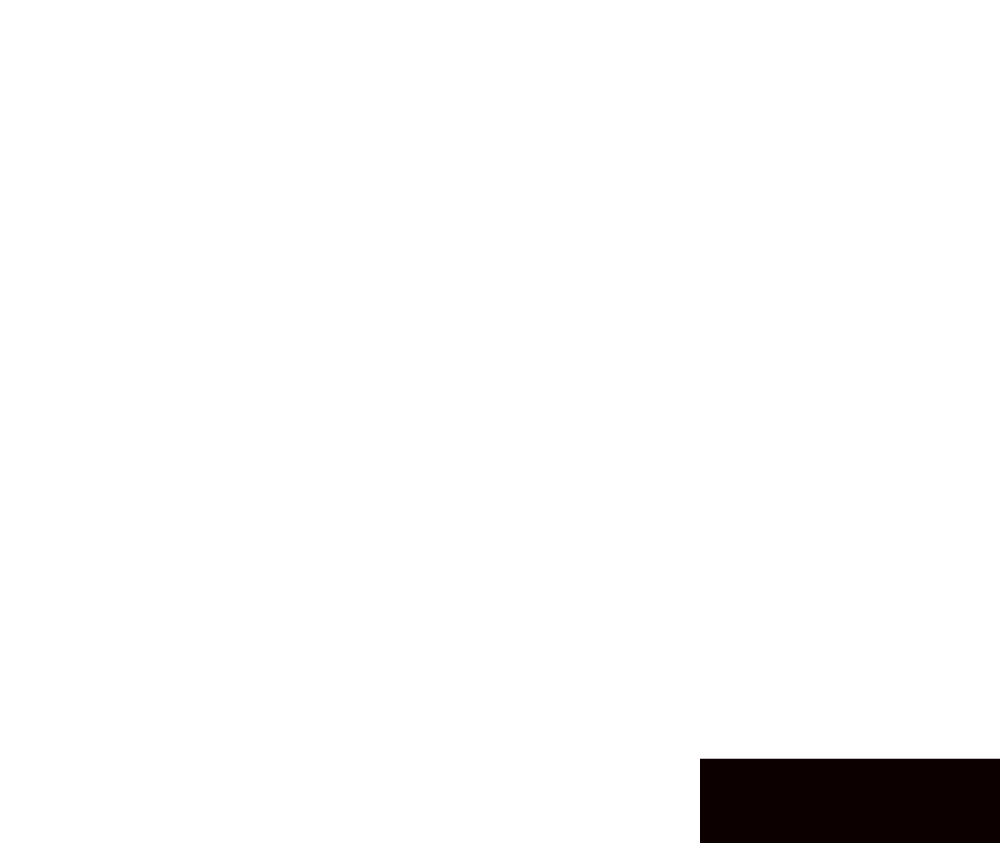

In [329]:
plotting.view_img(v1_ju,tpl_t1w, title="V1")

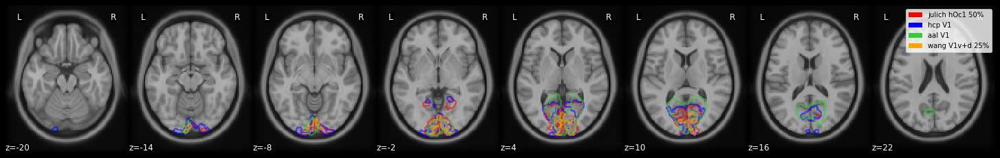

In [391]:
# plot these ROIs onto the brain
fig = plt.figure(figsize=(20,3), facecolor="k")
display = plotting.plot_anat(
    tpl_t1w, display_mode="z", cut_coords=list(range(-20,25,6)), figure=fig
)
masks = [v1_ju, v1_hcp, v1_aal, v1_wang]
colors = ["red", "blue", "limegreen",'orange']
for mask, color in zip(masks, colors):
    display.add_contours(
        mask,
        contours=1,
        antialiased=False,
        alpha=0.5,
        linewidth=4.0,
        levels=[0],
        colors=[color],
    )
p1 = Rectangle((0,0), 1, 1, fc="red")
p2 = Rectangle((0,0), 1, 1, fc="blue")
p3 = Rectangle((0,0), 1, 1, fc="limegreen")
p4 = Rectangle((0,0), 1, 1, fc="orange")
plt.legend([p1, p2, p3, p4], ["julich hOc1 50%", "hcp V1", "aal V1", "wang V1v+d 25%"], loc="best")

plt.show()

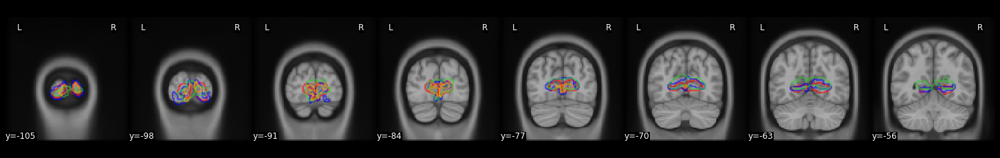

In [393]:
# plot these ROIs onto the brain
fig = plt.figure(figsize=(20,3), facecolor="k")
display = plotting.plot_anat(
    tpl_t1w, display_mode="y", cut_coords=list(range(-105,-50,7)), figure=fig
)
masks = [v1_ju, v1_hcp, v1_aal, v1_wang]
colors = ["red", "blue", "limegreen",'orange']
for mask, color in zip(masks, colors):
    display.add_contours(
        mask,
        contours=1,
        antialiased=False,
        alpha=0.5,
        linewidth=4.0,
        levels=[0],
        colors=[color],
    )
p1 = Rectangle((0,0), 1, 1, fc="red")
p2 = Rectangle((0,0), 1, 1, fc="blue")
p3 = Rectangle((0,0), 1, 1, fc="limegreen")
p4 = Rectangle((0,0), 1, 1, fc="orange")
#plt.legend([p1, p2, p3, p4], ["julich hOc1 50%", "hcp V1", "aal V1", "wang V1v+d 50%"], loc="best")

plt.show()

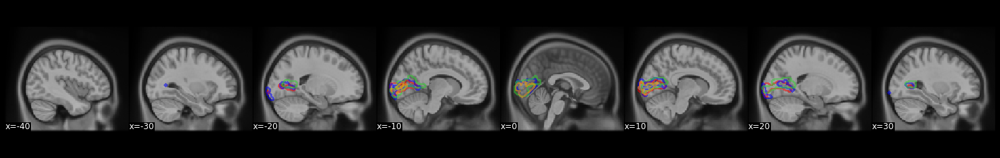

In [394]:
# plot these ROIs onto the brain
fig = plt.figure(figsize=(20,3), facecolor="k")
display = plotting.plot_anat(
    tpl_t1w, display_mode="x", cut_coords=list(range(-40,40,10)), figure=fig
)
masks = [v1_ju, v1_hcp, v1_aal, v1_wang]
colors = ["red", "blue", "limegreen",'orange']
for mask, color in zip(masks, colors):
    display.add_contours(
        mask,
        contours=1,
        antialiased=False,
        alpha=0.5,
        linewidth=4.0,
        levels=[0],
        colors=[color],
    )
p1 = Rectangle((0,0), 1, 1, fc="red")
p2 = Rectangle((0,0), 1, 1, fc="blue")
p3 = Rectangle((0,0), 1, 1, fc="limegreen")
p4 = Rectangle((0,0), 1, 1, fc="orange")
#plt.legend([p1, p2, p3, p4], ["julich hOc1 50%", "hcp V1", "aal V1", "wang V1v+d 50%"], loc="best")

plt.show()

# V2

In [395]:
# load roi from jubrain atlas
v2_lh_ju = nib.load('atlases/jubrain/separate_masks/2mm_Area hOc2 (V2, 18) left_prob50.nii')
v2_rh_ju = nib.load('atlases/jubrain/separate_masks/2mm_Area hOc2 (V2, 18) right_prob50.nii')
v2_ju = image.math_img("img1 + img2", img1=v2_lh_ju, img2=v2_rh_ju)

In [396]:
# load roi from hcp atlas
v2_lh_hcp = nib.load('atlases/HCP/separate_masks/2mm_V2_L.nii')
v2_rh_hcp = nib.load('atlases/HCP/separate_masks/2mm_V2_R.nii')
v2_hcp = image.math_img("img1 + img2", img1=v2_lh_hcp, img2=v2_rh_hcp)

In [397]:
# load roi from AAL atlas
# there is no separate v2/v3 regions in the aal atlas. The closest is the middle occipital ROI.
v2_lh_aal = nib.load('atlases/aal/separate_masks/2mm_Occipital_Mid_L.nii')
v2_rh_aal = nib.load('atlases/aal/separate_masks/2mm_Occipital_Mid_R.nii')
v2_aal = image.math_img("img1 + img2", img1=v2_lh_aal, img2=v2_rh_aal)

In [398]:
# load roi from wang atlas
v2v_lh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_V2v_lh_prob25.nii')
v2d_lh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_V2d_lh_prob25.nii')
v2v_rh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_V2v_rh_prob25.nii')
v2d_rh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_V2d_rh_prob25.nii')

In [399]:
# we want to combine v1v and v1d for the wang atlas
v2_lh_wang = image.math_img("img1 + img2", img1=v2v_lh_wang,img2=v2d_lh_wang)
v2_rh_wang = image.math_img("img1 + img2", img1=v2v_rh_wang,img2=v2d_rh_wang)
v2_wang = image.math_img("img1 + img2", img1=v2_lh_wang, img2=v2_rh_wang)

/home/yzmagnolia/anaconda3/lib/python3.9/site-packages/nilearn/plotting/html_document.py:59: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than {} '



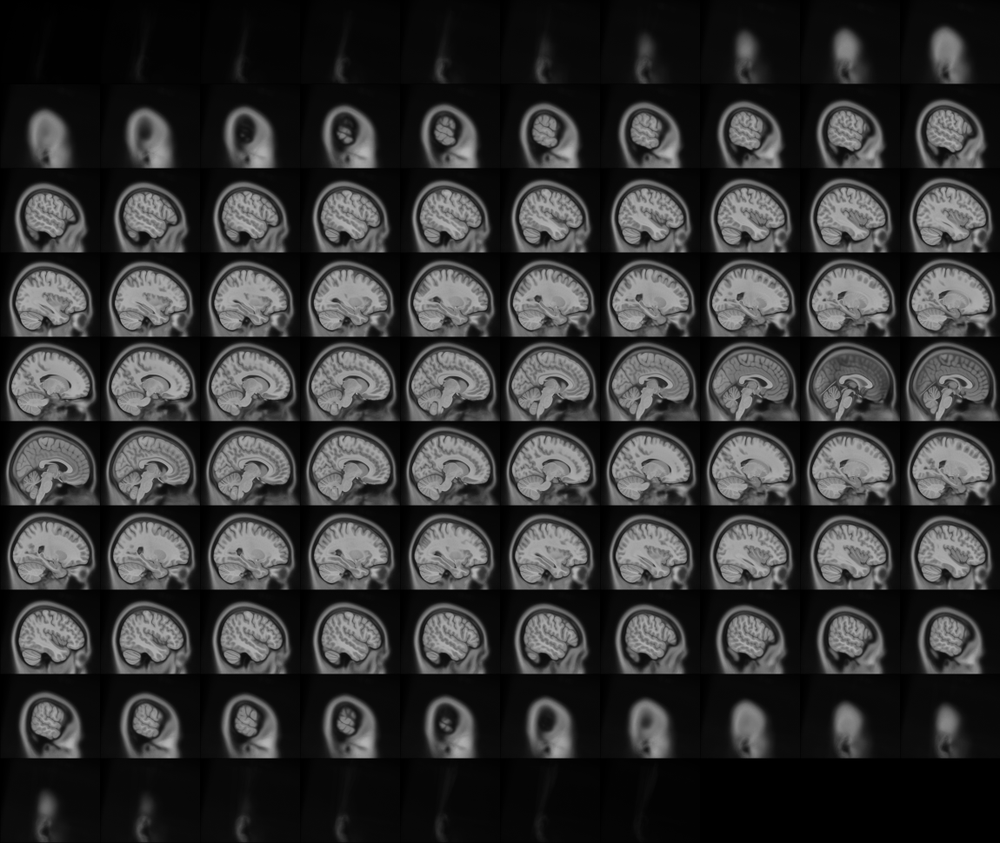
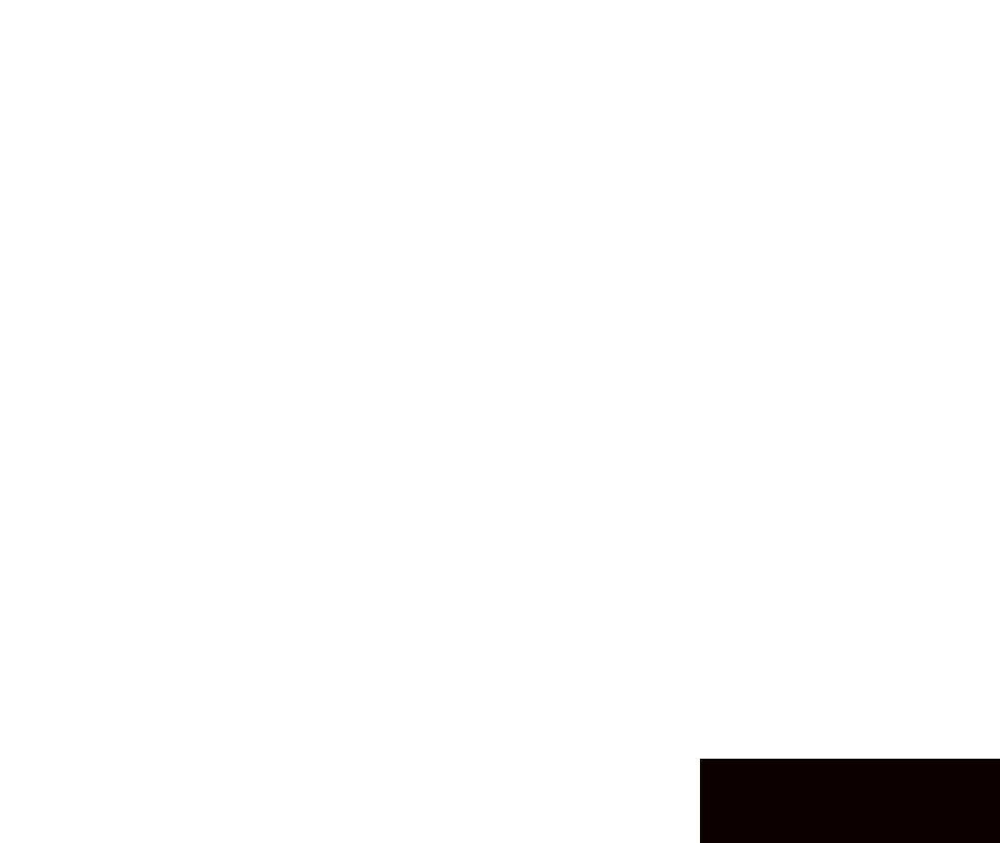

In [103]:
plotting.view_img(v2_aal,tpl_t1w, title="Middle occipital aal")
# middle occipital
# x: -50, 50
# y: -106, -54
# z: -8, 46

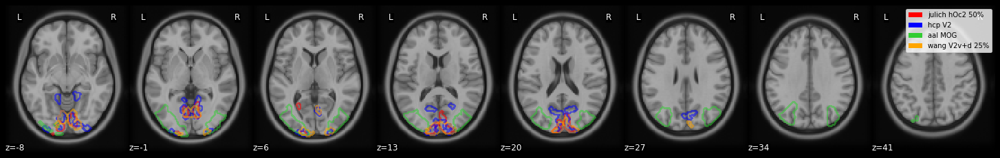

In [403]:
# plot these ROIs onto the brain
fig = plt.figure(figsize=(20,3), facecolor="k")
display = plotting.plot_anat(
    tpl_t1w, display_mode="z", cut_coords=list(range(-8,46,7)), figure=fig
)
masks = [v2_ju, v2_hcp, v2_aal, v2_wang]
colors = ["red", "blue", "limegreen",'orange']
for mask, color in zip(masks, colors):
    display.add_contours(
        mask,
        contours=1,
        antialiased=False,
        alpha=0.5,
        linewidth=4.0,
        levels=[0],
        colors=[color],
    )
p1 = Rectangle((0,0), 1, 1, fc="red")
p2 = Rectangle((0,0), 1, 1, fc="blue")
p3 = Rectangle((0,0), 1, 1, fc="limegreen")
p4 = Rectangle((0,0), 1, 1, fc="orange")
plt.legend([p1, p2, p3, p4], ["julich hOc2 50%", "hcp V2", "aal MOG", "wang V2v+d 25%"], loc="best")

plt.show()

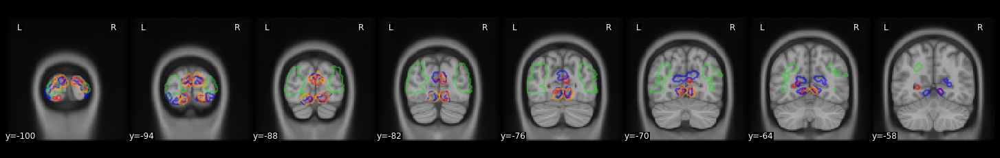

In [406]:
# plot these ROIs onto the brain
fig = plt.figure(figsize=(20,3), facecolor="k")
display = plotting.plot_anat(
    tpl_t1w, display_mode="y", cut_coords=list(range(-100,-54,6)), figure=fig
)
masks = [v2_ju, v2_hcp, v2_aal, v2_wang]
colors = ["red", "blue", "limegreen",'orange']
for mask, color in zip(masks, colors):
    display.add_contours(
        mask,
        contours=1,
        antialiased=False,
        alpha=0.5,
        linewidth=4.0,
        levels=[0],
        colors=[color],
    )
p1 = Rectangle((0,0), 1, 1, fc="red")
p2 = Rectangle((0,0), 1, 1, fc="blue")
p3 = Rectangle((0,0), 1, 1, fc="limegreen")
p4 = Rectangle((0,0), 1, 1, fc="orange")
#plt.legend([p1, p2, p3, p4], ["julich hOc2 50%", "hcp V2", "aal MOG", "wang V2v+d 50%"], loc="best")

plt.show()

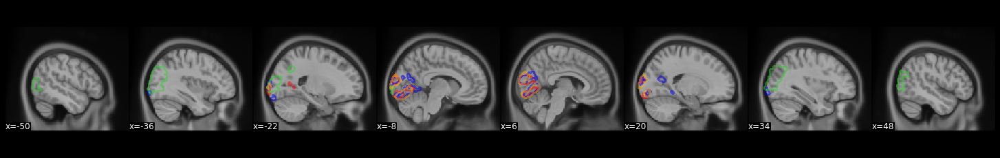

In [405]:
# plot these ROIs onto the brain
fig = plt.figure(figsize=(20,3), facecolor="k")
display = plotting.plot_anat(
    tpl_t1w, display_mode="x", cut_coords=list(range(-50, 50,14)), figure=fig
)
masks = [v2_ju, v2_hcp, v2_aal, v2_wang]
colors = ["red", "blue", "limegreen",'orange']
for mask, color in zip(masks, colors):
    display.add_contours(
        mask,
        contours=1,
        antialiased=False,
        alpha=0.5,
        linewidth=4.0,
        levels=[0],
        colors=[color],
    )
p1 = Rectangle((0,0), 1, 1, fc="red")
p2 = Rectangle((0,0), 1, 1, fc="blue")
p3 = Rectangle((0,0), 1, 1, fc="limegreen")
p4 = Rectangle((0,0), 1, 1, fc="orange")
#plt.legend([p1, p2, p3, p4], ["julich hOc2 50%", "hcp V2", "aal MOG", "wang V2v+d 50%"], loc="best")

plt.show()

# Posterior parietal cortex

In [4]:
# load roi from jubrain atlas
hip1_lh_ju  = nib.load('atlases/jubrain/separate_masks/2mm_Area hIP1 (IPS) left_prob50.nii')
hip1_rh_ju  = nib.load('atlases/jubrain/separate_masks/2mm_Area hIP1 (IPS) right_prob50.nii')
hip2_lh_ju  = nib.load('atlases/jubrain/separate_masks/2mm_Area hIP2 (IPS) left_prob50.nii')
hip2_rh_ju  = nib.load('atlases/jubrain/separate_masks/2mm_Area hIP2 (IPS) right_prob50.nii')
hip3_lh_ju  = nib.load('atlases/jubrain/separate_masks/2mm_Area hIP3 (IPS) left_prob50.nii')
hip3_rh_ju  = nib.load('atlases/jubrain/separate_masks/2mm_Area hIP3 (IPS) right_prob50.nii')
hip4_lh_ju  = nib.load('atlases/jubrain/separate_masks/2mm_Area hIP4 (IPS) left_prob50.nii')
hip4_rh_ju  = nib.load('atlases/jubrain/separate_masks/2mm_Area hIP4 (IPS) right_prob50.nii')
hip5_lh_ju  = nib.load('atlases/jubrain/separate_masks/2mm_Area hIP5 (IPS) left_prob50.nii')
hip5_rh_ju  = nib.load('atlases/jubrain/separate_masks/2mm_Area hIP5 (IPS) right_prob50.nii')
hip6_lh_ju  = nib.load('atlases/jubrain/separate_masks/2mm_Area hIP6 (IPS) left_prob50.nii')
hip6_rh_ju  = nib.load('atlases/jubrain/separate_masks/2mm_Area hIP6 (IPS) right_prob50.nii')
hip7_lh_ju  = nib.load('atlases/jubrain/separate_masks/2mm_Area hIP7 (IPS) left_prob50.nii')
hip7_rh_ju  = nib.load('atlases/jubrain/separate_masks/2mm_Area hIP7 (IPS) right_prob50.nii')
hip8_lh_ju  = nib.load('atlases/jubrain/separate_masks/2mm_Area hIP8 (IPS) left_prob50.nii')
hip8_rh_ju  = nib.load('atlases/jubrain/separate_masks/2mm_Area hIP8 (IPS) right_prob50.nii')


area7p_lh_ju = nib.load('atlases/jubrain/separate_masks/2mm_Area 7P (SPL) left_prob50.nii')
area7p_rh_ju = nib.load('atlases/jubrain/separate_masks/2mm_Area 7P (SPL) right_prob50.nii')
area7pc_lh_ju = nib.load('atlases/jubrain/separate_masks/2mm_Area 7PC (SPL) left_prob50.nii')
area7pc_rh_ju = nib.load('atlases/jubrain/separate_masks/2mm_Area 7PC (SPL) right_prob50.nii')
area7a_lh_ju = nib.load('atlases/jubrain/separate_masks/2mm_Area 7A (SPL) left_prob50.nii')
area7a_rh_ju = nib.load('atlases/jubrain/separate_masks/2mm_Area 7A (SPL) right_prob50.nii')

hip_ju = image.math_img("img1+img2+img3+img4+img5+img6+img7+img8+img9+img10+img11+img12+img13+img14+img15+img16", 
                         img1=hip1_lh_ju, img2=hip1_rh_ju,
                        img3=hip2_lh_ju, img4=hip2_rh_ju,
                        img5=hip3_lh_ju, img6=hip3_rh_ju,
                        img7=hip4_lh_ju, img8=hip4_rh_ju,
                        img9=hip5_lh_ju, img10=hip5_rh_ju,
                        img11=hip6_lh_ju, img12=hip6_rh_ju,
                        img13=hip7_lh_ju, img14=hip7_rh_ju,
                        img15=hip8_lh_ju, img16=hip8_rh_ju)

area7_ju = image.math_img("img1 + img2 + img3 + img4 + img5 + img6", 
                         img1=area7p_lh_ju, 
                         img2=area7p_rh_ju,
                        img3=area7pc_lh_ju,
                         img4=area7pc_rh_ju,
                         img5=area7a_lh_ju,
                         img6=area7a_rh_ju)

In [5]:
# load roi from hcp atlas
ips1_lh_hcp = nib.load('atlases/HCP/separate_masks/2mm_IPS1_L.nii')
ips1_rh_hcp = nib.load('atlases/HCP/separate_masks/2mm_IPS1_R.nii')

lipv_lh_hcp = nib.load('atlases/HCP/separate_masks/2mm_LIPv_L.nii')
lipv_rh_hcp = nib.load('atlases/HCP/separate_masks/2mm_LIPv_R.nii')
lipd_lh_hcp = nib.load('atlases/HCP/separate_masks/2mm_LIPd_L.nii')
lipd_rh_hcp = nib.load('atlases/HCP/separate_masks/2mm_LIPd_R.nii')

area7pl_lh_hcp = nib.load('atlases/HCP/separate_masks/2mm_7Pl_L.nii')
area7pl_rh_hcp = nib.load('atlases/HCP/separate_masks/2mm_7Pl_R.nii')
area7pc_lh_hcp = nib.load('atlases/HCP/separate_masks/2mm_7Pl_L.nii')
area7pc_rh_hcp = nib.load('atlases/HCP/separate_masks/2mm_7Pl_R.nii')
area7al_lh_hcp = nib.load('atlases/HCP/separate_masks/2mm_7Pl_L.nii')
area7al_rh_hcp = nib.load('atlases/HCP/separate_masks/2mm_7Pl_R.nii')

ips1_hcp = image.math_img("img1 + img2", img1=ips1_lh_hcp, img2=ips1_rh_hcp)
lip_hcp = image.math_img("img1 + img2 + img3 + img4", 
                         img1=lipv_lh_hcp, 
                         img2=lipv_rh_hcp,
                        img3=lipd_lh_hcp,
                         img4=lipd_rh_hcp)
area7_hcp = image.math_img("img1 + img2 + img3 + img4 + img5 + img6", 
                         img1=area7pl_lh_hcp, 
                         img2=area7pl_rh_hcp,
                        img3=area7pc_lh_hcp,
                         img4=area7pc_rh_hcp,
                         img5=area7al_lh_hcp,
                         img6=area7al_rh_hcp)
ips_hcp = image.math_img("img1 + img2", img1=ips1_hcp, img2=lip_hcp)

In [6]:
# load roi from AAL atlas
# there is no separate v2/v3 regions in the aal atlas. The closest is the middle occipital ROI.
spl_lh_aal = nib.load('atlases/aal/separate_masks/2mm_Parietal_Sup_L.nii')
spl_rh_aal = nib.load('atlases/aal/separate_masks/2mm_Parietal_Sup_R.nii')
spl_aal = image.math_img("img1 + img2", img1=spl_lh_aal, img2=spl_rh_aal)

lparietal_lh_aal = nib.load('atlases/aal/separate_masks/2mm_lateral_parietal_L.nii')
lparietal_rh_aal = nib.load('atlases/aal/separate_masks/2mm_lateral_parietal_R.nii')
lparietal_aal = image.math_img("img1 + img2", img1=lparietal_lh_aal,img2=lparietal_rh_aal)


In [31]:
# load roi from wang atlas
ips0_lh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_IPS0_lh_prob15.nii')
ips1_lh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_IPS1_lh_prob15.nii')
ips2_lh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_IPS2_lh_prob15.nii')
ips3_lh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_IPS3_lh_prob15.nii')
ips4_lh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_IPS4_lh_prob15.nii')
ips5_lh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_IPS5_lh_prob15.nii')
spl1_lh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_SPL1_lh_prob15.nii')

ips0_rh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_IPS0_rh_prob15.nii')
ips1_rh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_IPS1_rh_prob15.nii')
ips2_rh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_IPS2_rh_prob15.nii')
ips3_rh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_IPS3_rh_prob15.nii')
ips4_rh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_IPS4_rh_prob15.nii')
ips5_rh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_IPS5_rh_prob15.nii')
spl1_rh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_SPL1_rh_prob15.nii')

In [32]:
# we want to combine v1v and v1d for the wang atlas
ips_lh_wang = image.math_img("img1+img2+img3+img4+img5+img6", 
                             img1=ips0_lh_wang,img2=ips1_lh_wang,
                            img3=ips2_lh_wang,img4=ips3_lh_wang,
                            img5=ips4_lh_wang,img6=ips5_lh_wang)
ips_rh_wang = image.math_img("img1+img2+img3+img4+img5+img6", 
                             img1=ips0_rh_wang,img2=ips1_rh_wang,
                            img3=ips2_rh_wang,img4=ips3_rh_wang,
                            img5=ips4_rh_wang,img6=ips5_rh_wang)
ips_wang = image.math_img("img1 + img2", img1=ips_lh_wang,img2=ips_rh_wang)
spl1_wang = image.math_img("img1 + img2", img1=spl1_lh_wang, img2=spl1_rh_wang)

In [33]:
ips0_wang = image.math_img("img1+img2", 
                             img1=ips0_lh_wang,img2=ips0_rh_wang)
nilearn.image.get_data(ips0_wang).sum()

1650

In [34]:
ips1_wang = image.math_img("img1+img2", 
                             img1=ips1_lh_wang,img2=ips1_rh_wang)
nilearn.image.get_data(ips1_wang).sum()

994

In [35]:
ips2_wang = image.math_img("img1+img2", 
                             img1=ips2_lh_wang,img2=ips2_rh_wang)
nilearn.image.get_data(ips2_wang).sum()

766

In [36]:
ips3_wang = image.math_img("img1+img2", 
                             img1=ips3_lh_wang,img2=ips3_rh_wang)
nilearn.image.get_data(ips3_wang).sum()

491

In [37]:
ips4_wang = image.math_img("img1+img2", 
                             img1=ips4_lh_wang,img2=ips4_rh_wang)
nilearn.image.get_data(ips4_wang).sum()

439

In [38]:
ips5_wang = image.math_img("img1+img2", 
                             img1=ips5_lh_wang,img2=ips5_rh_wang)
nilearn.image.get_data(ips5_wang).sum()

404

In [39]:
nilearn.image.get_data(spl1_wang).sum()

585

/home/yzmagnolia/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:771: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



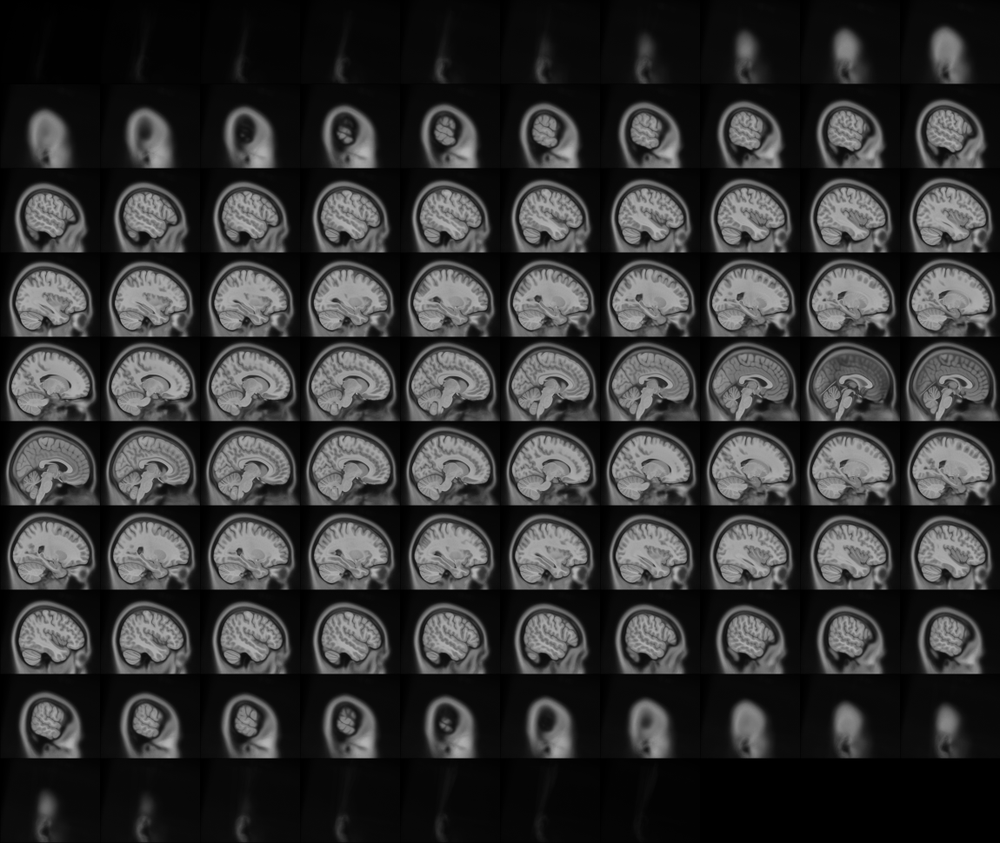
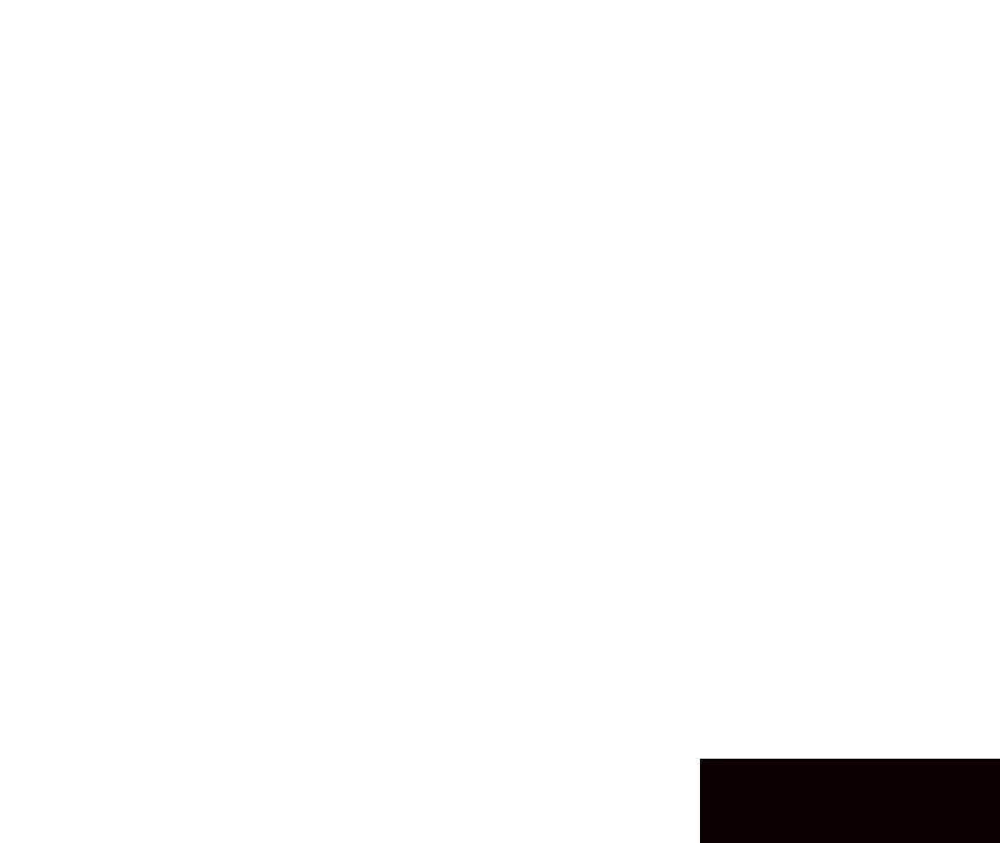

In [9]:
plotting.view_img(lparietal_aal,tpl_t1w, title="Lateral parietal aal")
# middle occipital
# x: -64, 64
# y: -12, -80
# z: 24, 62

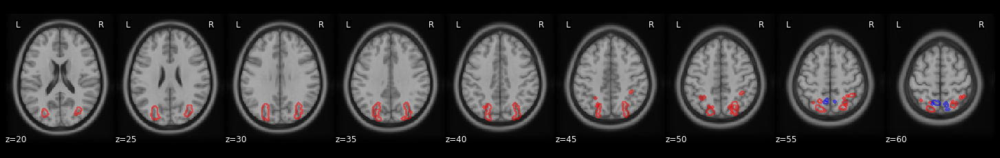

In [11]:
# plot these ROIs onto the brain
fig = plt.figure(figsize=(20,3), facecolor="k")
display = plotting.plot_anat(
    tpl_t1w, display_mode="z", cut_coords=list(range(20,65,5)), figure=fig
)
masks = [ips_wang,spl1_wang]#[hip_ju, ips_hcp, spl_aal, ips_wang]
colors = ["red", "blue"] #"limegreen",'orange']
for mask, color in zip(masks, colors):
    display.add_contours(
        mask,
        contours=1,
        antialiased=False,
        alpha=0.5,
        linewidth=4.0,
        levels=[0],
        colors=[color],
    )
p1 = Rectangle((0,0), 1, 1, fc="red")
p2 = Rectangle((0,0), 1, 1, fc="blue")
#p3 = Rectangle((0,0), 1, 1, fc="limegreen")
#p4 = Rectangle((0,0), 1, 1, fc="orange")
#plt.legend([p1, p2, p3, p4], ["julich hIP1-8 50%", "hcp IPS1+LIPv/d", "aal SPL", "wang IPS0-5 25%"], loc="best")

plt.show()

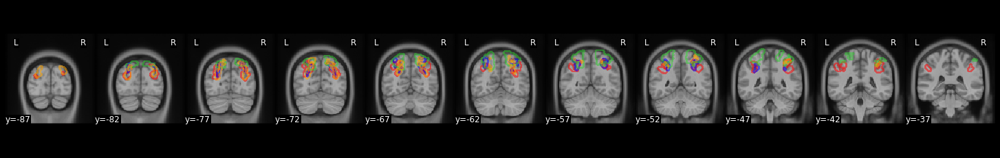

In [363]:
# plot these ROIs onto the brain
fig = plt.figure(figsize=(20,3), facecolor="k")
display = plotting.plot_anat(
    tpl_t1w, display_mode="y", cut_coords=list(range(-87,-35,5)), figure=fig
)
masks = [hip_ju, ips_hcp, spl_aal, ips_wang]
colors = ["red", "blue", "limegreen",'orange']
for mask, color in zip(masks, colors):
    display.add_contours(
        mask,
        contours=1,
        antialiased=False,
        alpha=0.5,
        linewidth=4.0,
        levels=[0],
        colors=[color],
    )
p1 = Rectangle((0,0), 1, 1, fc="red")
p2 = Rectangle((0,0), 1, 1, fc="blue")
p3 = Rectangle((0,0), 1, 1, fc="limegreen")
p4 = Rectangle((0,0), 1, 1, fc="orange")
#plt.legend([p1, p2, p3, p4], ["julich", "hcp", "aal", "wang"], loc="lower right")

plt.show()

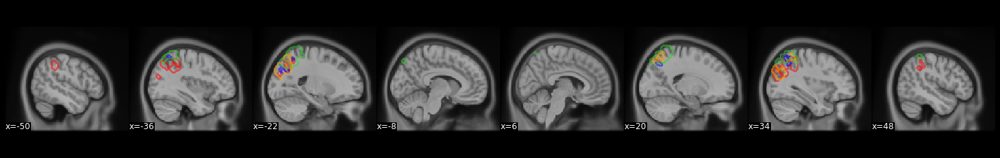

In [364]:
# plot these ROIs onto the brain
fig = plt.figure(figsize=(20,3), facecolor="k")
display = plotting.plot_anat(
    tpl_t1w, display_mode="x", cut_coords=list(range(-50,50,14)), figure=fig
)
masks = [hip_ju, ips_hcp, spl_aal, ips_wang]
colors = ["red", "blue", "limegreen",'orange']
for mask, color in zip(masks, colors):
    display.add_contours(
        mask,
        contours=1,
        antialiased=False,
        alpha=0.5,
        linewidth=4.0,
        levels=[0],
        colors=[color],
    )
p1 = Rectangle((0,0), 1, 1, fc="red")
p2 = Rectangle((0,0), 1, 1, fc="blue")
p3 = Rectangle((0,0), 1, 1, fc="limegreen")
p4 = Rectangle((0,0), 1, 1, fc="orange")
#plt.legend([p1, p2, p3, p4], ["julich", "hcp", "aal", "wang"], loc="best")

plt.show()

### Plot SPL

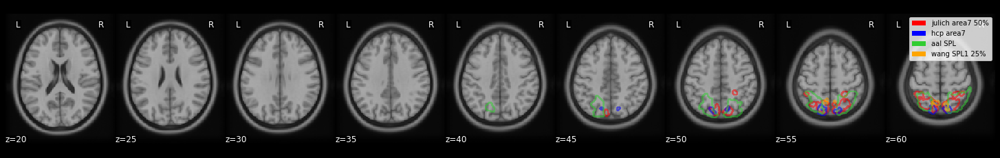

In [368]:
# plot these ROIs onto the brain
fig = plt.figure(figsize=(20,3), facecolor="k")
display = plotting.plot_anat(
    tpl_t1w, display_mode="z", cut_coords=list(range(20,62,5)), figure=fig
)
masks = [area7_ju, area7_hcp, spl_aal, spl1_wang]
colors = ["red", "blue", "limegreen",'orange']
for mask, color in zip(masks, colors):
    display.add_contours(
        mask,
        contours=1,
        antialiased=False,
        alpha=0.5,
        linewidth=4.0,
        levels=[0],
        colors=[color],
    )
p1 = Rectangle((0,0), 1, 1, fc="red")
p2 = Rectangle((0,0), 1, 1, fc="blue")
p3 = Rectangle((0,0), 1, 1, fc="limegreen")
p4 = Rectangle((0,0), 1, 1, fc="orange")
plt.legend([p1, p2, p3, p4], ["julich area7 50%", "hcp area7", "aal SPL", "wang SPL1 25%"], loc="best")

plt.show()

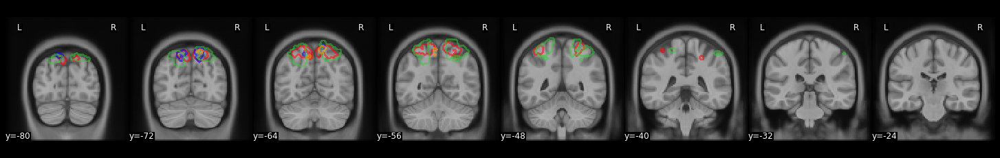

In [369]:
# plot these ROIs onto the brain
fig = plt.figure(figsize=(20,3), facecolor="k")
display = plotting.plot_anat(
    tpl_t1w, display_mode="y", cut_coords=list(range(-80,-20,8)), figure=fig
)
masks = [area7_ju, area7_hcp, spl_aal, spl1_wang]
colors = ["red", "blue", "limegreen",'orange']
for mask, color in zip(masks, colors):
    display.add_contours(
        mask,
        contours=1,
        antialiased=False,
        alpha=0.5,
        linewidth=4.0,
        levels=[0],
        colors=[color],
    )
p1 = Rectangle((0,0), 1, 1, fc="red")
p2 = Rectangle((0,0), 1, 1, fc="blue")
p3 = Rectangle((0,0), 1, 1, fc="limegreen")
p4 = Rectangle((0,0), 1, 1, fc="orange")
#plt.legend([p1, p2, p3, p4], ["julich", "hcp", "aal", "wang"], loc="lower right")

plt.show()

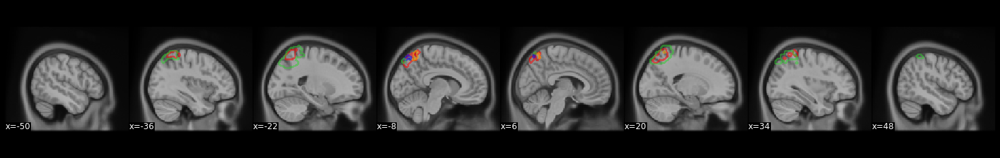

In [370]:
# plot these ROIs onto the brain
fig = plt.figure(figsize=(20,3), facecolor="k")
display = plotting.plot_anat(
    tpl_t1w, display_mode="x", cut_coords=list(range(-50,50,14)), figure=fig
)
masks = [area7_ju, area7_hcp, spl_aal, spl1_wang]
colors = ["red", "blue", "limegreen",'orange']
for mask, color in zip(masks, colors):
    display.add_contours(
        mask,
        contours=1,
        antialiased=False,
        alpha=0.5,
        linewidth=4.0,
        levels=[0],
        colors=[color],
    )
p1 = Rectangle((0,0), 1, 1, fc="red")
p2 = Rectangle((0,0), 1, 1, fc="blue")
p3 = Rectangle((0,0), 1, 1, fc="limegreen")
p4 = Rectangle((0,0), 1, 1, fc="orange")
#plt.legend([p1, p2, p3, p4], ["julich", "hcp", "aal", "wang"], loc="best")

plt.show()

# Primary motor cortex (for control)

In [490]:
# load roi from jubrain atlas
# primary motor cortex
area4a_lh_ju  = nib.load('atlases/jubrain/separate_masks/2mm_Area 4a (PreCG) left_prob50.nii')
area4a_rh_ju  = nib.load('atlases/jubrain/separate_masks/2mm_Area 4a (PreCG) right_prob50.nii')
area4p_lh_ju  = nib.load('atlases/jubrain/separate_masks/2mm_Area 4p (PreCG) left_prob50.nii')
area4p_rh_ju  = nib.load('atlases/jubrain/separate_masks/2mm_Area 4p (PreCG) right_prob50.nii')

area4_ju = image.math_img("img1+img2+img3+img4",
                        img1=area4a_lh_ju, img2=area4a_rh_ju,
                        img3=area4p_lh_ju, img4=area4p_rh_ju)

In [491]:
# load roi from hcp atlas
area4_lh_hcp = nib.load('atlases/HCP/separate_masks/2mm_4_L.nii')
area4_rh_hcp = nib.load('atlases/HCP/separate_masks/2mm_4_R.nii')
area4_hcp = image.math_img("img1+img2",
                        img1=area4_lh_hcp, img2=area4_rh_hcp)

In [492]:
# precentral sulcus
pcs_lh_aal = nib.load('atlases/aal/separate_masks/2mm_Precentral_L.nii')
pcs_rh_aal = nib.load('atlases/aal/separate_masks/2mm_Precentral_R.nii')
pcs_aal = image.math_img("img1 + img2", img1=pcs_lh_aal, img2=pcs_rh_aal)


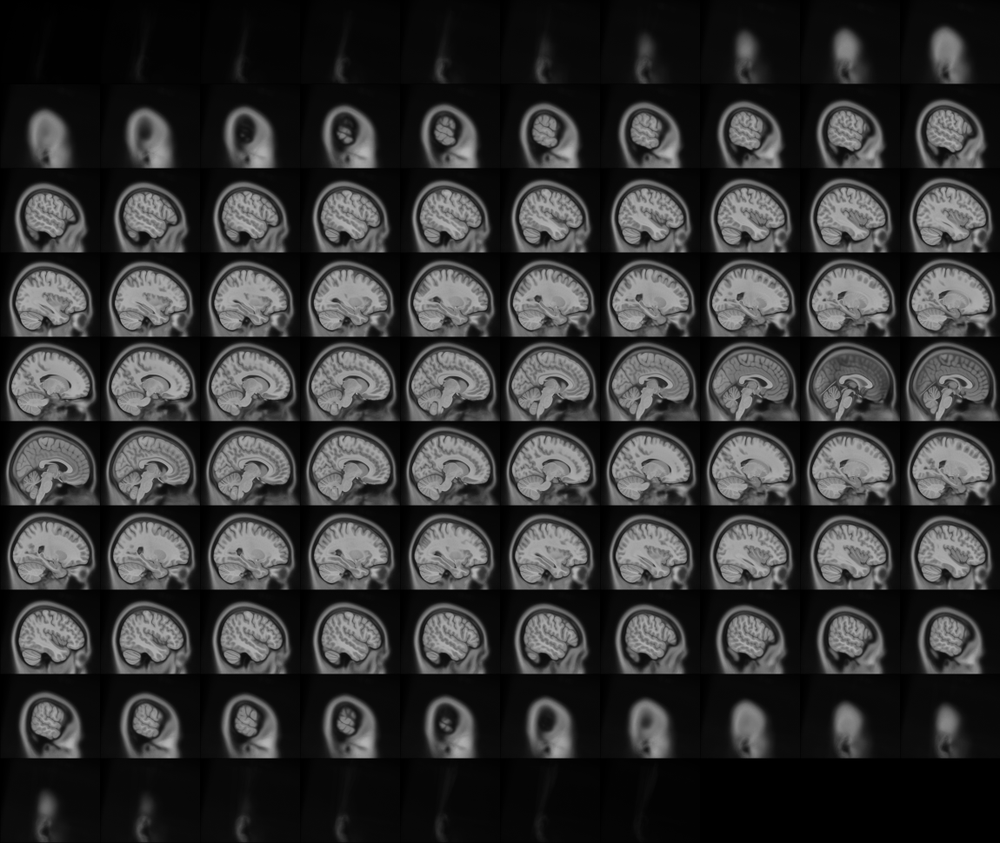
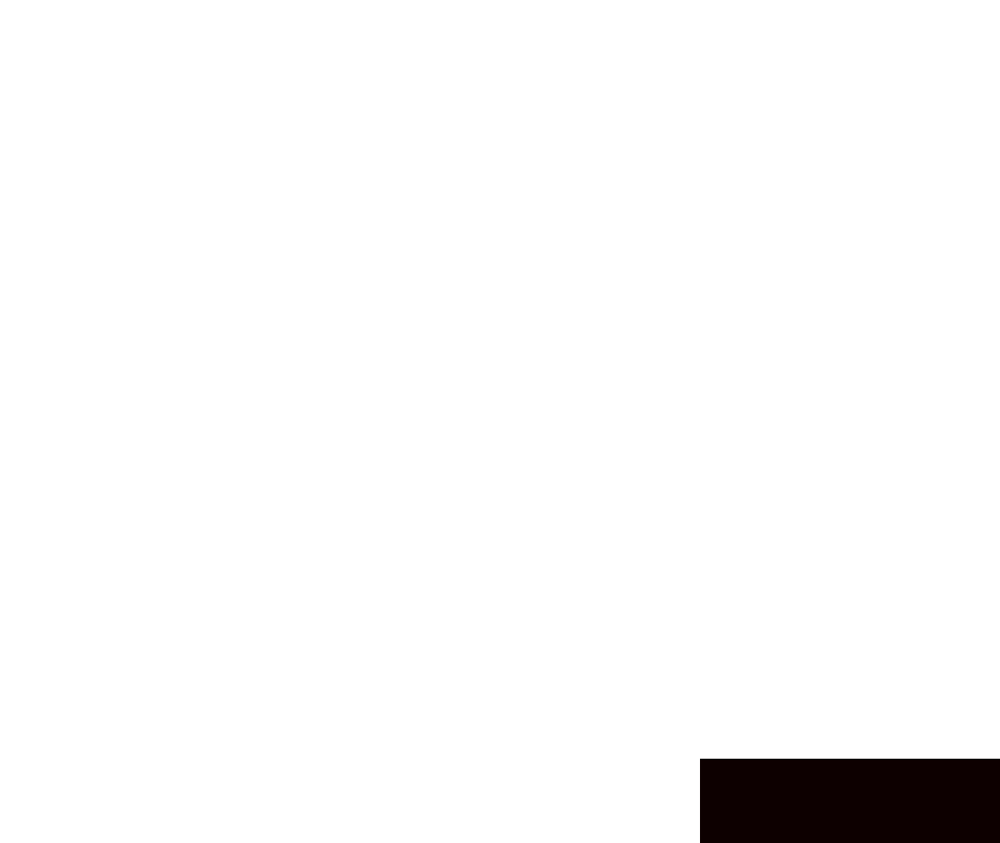

In [488]:
plotting.view_img(area4_ju,tpl_t1w, title="area4 ju")
# x: -44, 44
# y: -40, 0
# z: 52, 82

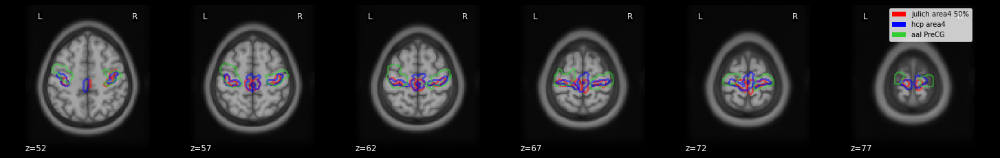

In [493]:
fig = plt.figure(figsize=(20,3), facecolor="k")
display = plotting.plot_anat(
    tpl_t1w, display_mode="z", cut_coords=list(range(52,82,5)), figure=fig
)
masks = [area4_ju, area4_hcp, pcs_aal]
colors = ["red", "blue", "limegreen",'orange']
for mask, color in zip(masks, colors):
    display.add_contours(
        mask,
        contours=1,
        antialiased=False,
        alpha=0.5,
        linewidth=4.0,
        levels=[0],
        colors=[color],
    )
p1 = Rectangle((0,0), 1, 1, fc="red")
p2 = Rectangle((0,0), 1, 1, fc="blue")
p3 = Rectangle((0,0), 1, 1, fc="limegreen")
p4 = Rectangle((0,0), 1, 1, fc="orange")
plt.legend([p1, p2, p3], ["julich area4 50%", "hcp area4", "aal PreCG"], loc="best")

plt.show()

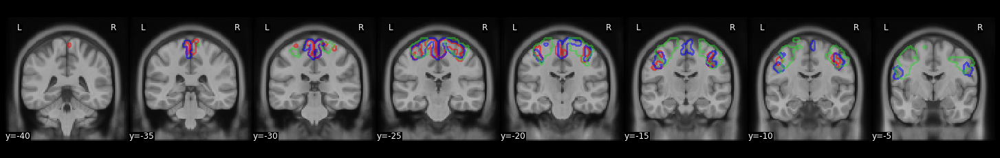

In [494]:
# plot these ROIs onto the brain
fig = plt.figure(figsize=(20,3), facecolor="k")
display = plotting.plot_anat(
    tpl_t1w, display_mode="y", cut_coords=list(range(-40,0,5)), figure=fig
)
masks = [area4_ju, area4_hcp, pcs_aal]
colors = ["red", "blue", "limegreen",'orange']
for mask, color in zip(masks, colors):
    display.add_contours(
        mask,
        contours=1,
        antialiased=False,
        alpha=0.5,
        linewidth=4.0,
        levels=[0],
        colors=[color],
    )

plt.show()

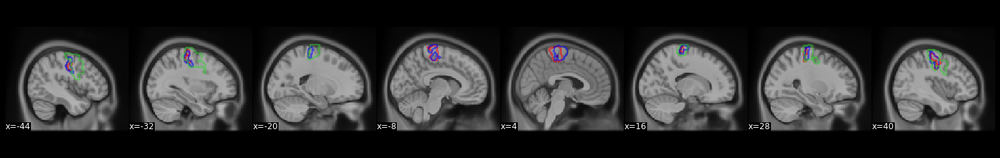

In [497]:
# plot these ROIs onto the brain
fig = plt.figure(figsize=(20,3), facecolor="k")
display = plotting.plot_anat(
    tpl_t1w, display_mode="x", cut_coords=list(range(-44,44,12)), figure=fig
)
masks = [area4_ju, area4_hcp, pcs_aal]
colors = ["red", "blue", "limegreen",'orange']
for mask, color in zip(masks, colors):
    display.add_contours(
        mask,
        contours=1,
        antialiased=False,
        alpha=0.5,
        linewidth=4.0,
        levels=[0],
        colors=[color],
    )

plt.show()

# Dorsolateral prefrontal cortex

In [12]:
# load roi from jubrain atlas
# sfg
area8d1_lh_ju  = nib.load('atlases/jubrain/separate_masks/2mm_Area 8d1 (SFG) left_prob50.nii')
area8d1_rh_ju  = nib.load('atlases/jubrain/separate_masks/2mm_Area 8d1 (SFG) right_prob50.nii')
area8d2_lh_ju  = nib.load('atlases/jubrain/separate_masks/2mm_Area 8d2 (SFG) left_prob50.nii')
area8d2_rh_ju  = nib.load('atlases/jubrain/separate_masks/2mm_Area 8d2 (SFG) right_prob50.nii')

# mfg
area8v1_lh_ju  = nib.load('atlases/jubrain/separate_masks/2mm_Area 8v1 (MFG) left_prob50.nii')
area8v1_rh_ju  = nib.load('atlases/jubrain/separate_masks/2mm_Area 8v1 (MFG) right_prob50.nii')
area8v2_lh_ju  = nib.load('atlases/jubrain/separate_masks/2mm_Area 8v2 (MFG) left_prob50.nii')
area8v2_rh_ju  = nib.load('atlases/jubrain/separate_masks/2mm_Area 8v2 (MFG) right_prob50.nii')

# frontal-I
pfc1_lh_ju = nib.load('atlases/jubrain/separate_masks/2mm_Frontal-I (GapMap) left_prob50.nii')
pfc1_rh_ju = nib.load('atlases/jubrain/separate_masks/2mm_Frontal-I (GapMap) right_prob50.nii')


sfg_ju = image.math_img("img1+img2+img3+img4",
                        img1=area8d1_lh_ju, img2=area8d1_rh_ju,
                        img3=area8d2_lh_ju, img4=area8d2_rh_ju)
mfg_ju = image.math_img("img1+img2+img3+img4",
                        img1=area8v1_lh_ju, img2=area8v1_rh_ju,
                        img3=area8v2_lh_ju, img4=area8v2_rh_ju)
pfc1_ju = image.math_img("img1+img2",
                        img1=pfc1_lh_ju, img2=pfc1_rh_ju)

In [13]:
# load roi from hcp atlas
# frontal eye field
fef_lh_hcp = nib.load('atlases/HCP/separate_masks/2mm_FEF_L.nii')
fef_rh_hcp = nib.load('atlases/HCP/separate_masks/2mm_FEF_R.nii')
# premotor eye field, not parietal eye field
pef_lh_hcp = nib.load('atlases/HCP/separate_masks/2mm_PEF_L.nii')
pef_rh_hcp = nib.load('atlases/HCP/separate_masks/2mm_PEF_R.nii')

# sfg
sfl_lh_hcp = nib.load('atlases/HCP/separate_masks/2mm_SFL_L.nii')
sfl_rh_hcp = nib.load('atlases/HCP/separate_masks/2mm_SFL_R.nii')

area8bl_lh_hcp = nib.load('atlases/HCP/separate_masks/2mm_8BL_L.nii')
area8bl_rh_hcp = nib.load('atlases/HCP/separate_masks/2mm_8BL_R.nii')
area8ad_lh_hcp = nib.load('atlases/HCP/separate_masks/2mm_8Ad_L.nii')
area8ad_rh_hcp = nib.load('atlases/HCP/separate_masks/2mm_8Ad_R.nii')
area8av_lh_hcp = nib.load('atlases/HCP/separate_masks/2mm_8Av_L.nii')
area8av_rh_hcp = nib.load('atlases/HCP/separate_masks/2mm_8Av_R.nii')
area8c_lh_hcp = nib.load('atlases/HCP/separate_masks/2mm_8C_L.nii')
area8c_rh_hcp = nib.load('atlases/HCP/separate_masks/2mm_8C_R.nii')

area9a_lh_hcp = nib.load('atlases/HCP/separate_masks/2mm_9a_L.nii')
area9a_rh_hcp = nib.load('atlases/HCP/separate_masks/2mm_9a_R.nii')
area9p_lh_hcp = nib.load('atlases/HCP/separate_masks/2mm_9p_L.nii')
area9p_rh_hcp = nib.load('atlases/HCP/separate_masks/2mm_9p_R.nii')

# mfg
area9_46d_lh_hcp = nib.load('atlases/HCP/separate_masks/2mm_9-46d_L.nii')
area9_46d_rh_hcp = nib.load('atlases/HCP/separate_masks/2mm_9-46d_R.nii')
a9_46v_lh_hcp = nib.load('atlases/HCP/separate_masks/2mm_a9-46v_L.nii')
a9_46v_rh_hcp = nib.load('atlases/HCP/separate_masks/2mm_a9-46v_R.nii')
p9_46v_lh_hcp = nib.load('atlases/HCP/separate_masks/2mm_p9-46v_L.nii')
p9_46v_rh_hcp = nib.load('atlases/HCP/separate_masks/2mm_p9-46v_R.nii')

# ifg: 44, 45, 47

# combine these images
fef_hcp = image.math_img("img1 + img2", img1=fef_lh_hcp, img2=fef_rh_hcp)
pef_hcp = image.math_img("img1 + img2", img1=pef_lh_hcp, img2=pef_rh_hcp)
fpef_hcp = image.math_img("img1 + img2", img1=fef_hcp, img2=pef_hcp)

sfl_hcp = image.math_img("img1 + img2", img1=sfl_lh_hcp, img2=sfl_rh_hcp)
area8_hcp = image.math_img("img1 + img2 + img3 + img4 + img5 + img6 + img7 + img8", 
                         img1=area8bl_lh_hcp, 
                         img2=area8bl_rh_hcp,
                        img3=area8ad_lh_hcp,
                         img4=area8ad_rh_hcp,
                         img5=area8av_lh_hcp,
                         img6=area8av_rh_hcp,
                          img7=area8c_lh_hcp,
                          img8=area8c_rh_hcp)

area9_hcp = image.math_img("img1 + img2 + img3 + img4", 
                         img1=area9a_lh_hcp, 
                         img2=area9a_rh_hcp,
                        img3=area9p_lh_hcp,
                         img4=area9p_rh_hcp)

area9_46_hcp = image.math_img("img1 + img2 + img3 + img4 + img5 + img6", 
                         img1=area9_46d_lh_hcp, 
                         img2=area9_46d_rh_hcp,
                        img3=a9_46v_lh_hcp,
                         img4=a9_46v_rh_hcp,
                         img5=p9_46v_lh_hcp,
                         img6=p9_46v_rh_hcp)

In [14]:
# load roi from AAL atlas
# superior frontal gyrus
sfg_lh_aal = nib.load('atlases/aal/separate_masks/2mm_Frontal_Sup_L.nii')
sfg_rh_aal = nib.load('atlases/aal/separate_masks/2mm_Frontal_Sup_R.nii')
sfg_aal = image.math_img("img1 + img2", img1=sfg_lh_aal, img2=sfg_rh_aal)

# middle frontal gyrus
mfg_lh_aal = nib.load('atlases/aal/separate_masks/2mm_Frontal_Mid_L.nii')
mfg_rh_aal = nib.load('atlases/aal/separate_masks/2mm_Frontal_Mid_R.nii')
mfg_aal = image.math_img("img1 + img2", img1=mfg_lh_aal, img2=mfg_rh_aal)

# precentral sulcus
pcs_lh_aal = nib.load('atlases/aal/separate_masks/2mm_Precentral_L.nii')
pcs_rh_aal = nib.load('atlases/aal/separate_masks/2mm_Precentral_R.nii')
pcs_aal = image.math_img("img1 + img2", img1=pcs_lh_aal, img2=pcs_rh_aal)

# all
sfg_mfg_pcs_aal = image.math_img("img1 + img2 + img3", img1=sfg_aal, img2=mfg_aal, img3=pcs_aal)

# inferior frontal gyrus
ifg_oper_lh_aal = nib.load('atlases/aal/separate_masks/2mm_Frontal_Inf_Oper_L.nii')
ifg_oper_rh_aal = nib.load('atlases/aal/separate_masks/2mm_Frontal_Inf_Oper_R.nii')
ifg_orb_lh_aal = nib.load('atlases/aal/separate_masks/2mm_Frontal_Inf_Orb_L.nii')
ifg_orb_rh_aal = nib.load('atlases/aal/separate_masks/2mm_Frontal_Inf_Orb_R.nii')
ifg_tri_lh_aal = nib.load('atlases/aal/separate_masks/2mm_Frontal_Inf_Tri_L.nii')
ifg_tri_rh_aal = nib.load('atlases/aal/separate_masks/2mm_Frontal_Inf_Tri_R.nii')
ifg_oper_aal = image.math_img("img1 + img2", img1=ifg_oper_lh_aal, img2=ifg_oper_rh_aal)
ifg_orb_aal = image.math_img("img1 + img2", img1=ifg_orb_lh_aal, img2=ifg_orb_rh_aal)
ifg_tri_aal = image.math_img("img1 + img2", img1=ifg_tri_lh_aal, img2=ifg_tri_rh_aal)
ifg_aal = image.math_img("img1 + img2 + img3", img1=ifg_oper_aal, img2=ifg_orb_aal, img3=ifg_tri_aal)

In [16]:
# save AAL ROI
nib.save(mfg_aal, 'mfg_aal.nii')
nib.save(sfg_aal, 'sfg_aal.nii')
nib.save(ifg_aal, 'ifg_aal.nii')

In [15]:
# load roi from wang atlas
fef_lh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_FEF_lh_prob25.nii')
fef_rh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_FEF_rh_prob25.nii')
fef_wang = image.math_img("img1 + img2", img1=fef_lh_wang, img2=fef_rh_wang)


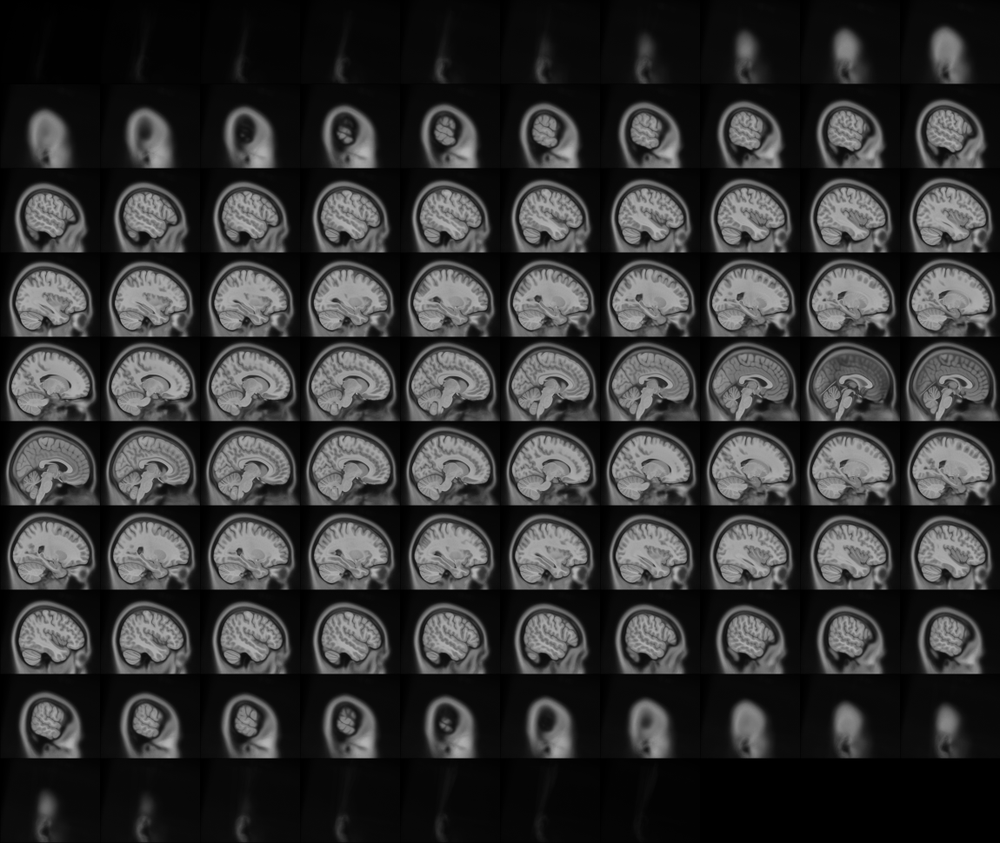
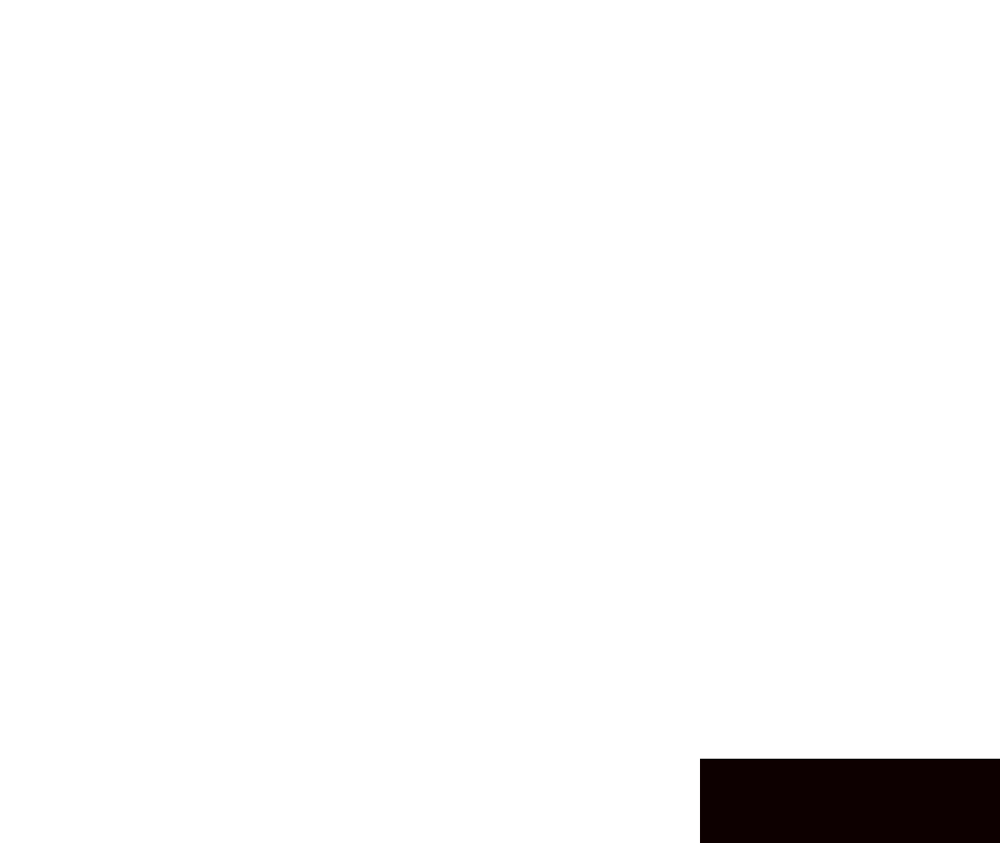

In [159]:
plotting.view_img(sfg_mfg_pcs_aal,tpl_t1w, title="dlpfc aal")
# middle occipital
# x: -60, 60
# y: -10, 76
# z: 2, 80

### Plot FEF

In [20]:
import nilearn
nilearn.image.get_data(fef_wang).sum()

1091

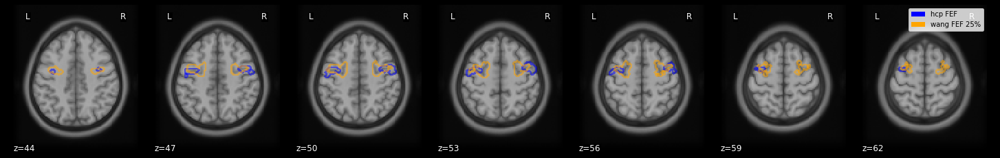

In [16]:
# plot these ROIs onto the brain
fig = plt.figure(figsize=(20,3), facecolor="k")
display = plotting.plot_anat(
    tpl_t1w, display_mode="z", cut_coords=list(range(44,65,3)), figure=fig
)
masks = [fef_hcp, fef_wang]
colors = ["blue",'orange']
for mask, color in zip(masks, colors):
    display.add_contours(
        mask,
        contours=1,
        antialiased=False,
        alpha=0.5,
        linewidth=4.0,
        levels=[0],
        colors=[color],
    )
p1 = Rectangle((0,0), 1, 1, fc="red")
p2 = Rectangle((0,0), 1, 1, fc="blue")
p3 = Rectangle((0,0), 1, 1, fc="limegreen")
p4 = Rectangle((0,0), 1, 1, fc="orange")
plt.legend([ p2,  p4], ["hcp FEF", "wang FEF 25%"], loc="best")

plt.show()

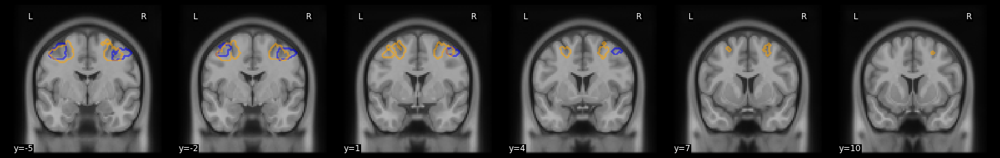

In [388]:
# plot these ROIs onto the brain
fig = plt.figure(figsize=(20,3), facecolor="k")
display = plotting.plot_anat(
    tpl_t1w, display_mode="y", cut_coords=list(range(-5, 12,3)), figure=fig
)
masks = [fef_hcp, fef_wang]
colors = ["blue",'orange']
for mask, color in zip(masks, colors):
    display.add_contours(
        mask,
        contours=1,
        antialiased=False,
        alpha=0.5,
        linewidth=4.0,
        levels=[0],
        colors=[color],
    )
p1 = Rectangle((0,0), 1, 1, fc="red")
p2 = Rectangle((0,0), 1, 1, fc="blue")
p3 = Rectangle((0,0), 1, 1, fc="limegreen")
p4 = Rectangle((0,0), 1, 1, fc="orange")
#plt.legend([ p2,  p4], ["hcp", "wang"], loc="best")

plt.show()

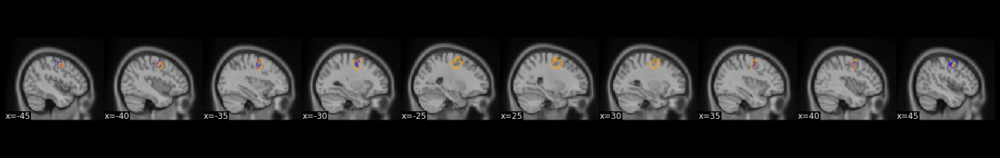

In [389]:
# plot these ROIs onto the brain
fig = plt.figure(figsize=(20,3), facecolor="k")
display = plotting.plot_anat(
    tpl_t1w, display_mode="x", cut_coords=[-45,-40,-35,-30,-25,25,30,35,40,45], figure=fig
)
masks = [fef_hcp, fef_wang]
colors = ["blue",'orange']
for mask, color in zip(masks, colors):
    display.add_contours(
        mask,
        contours=1,
        antialiased=False,
        alpha=0.5,
        linewidth=4.0,
        levels=[0],
        colors=[color],
    )
p1 = Rectangle((0,0), 1, 1, fc="red")
p2 = Rectangle((0,0), 1, 1, fc="blue")
p3 = Rectangle((0,0), 1, 1, fc="limegreen")
p4 = Rectangle((0,0), 1, 1, fc="orange")
#plt.legend([ p2,  p4], ["hcp", "wang"], loc="best")

plt.show()

### Plot SFG

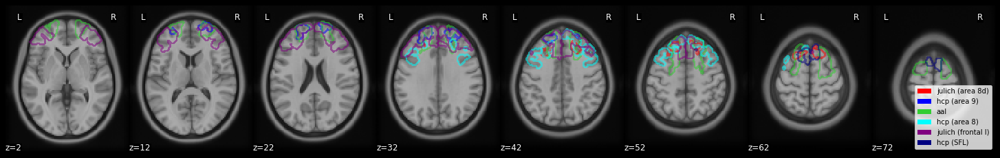

In [210]:
# plot these ROIs onto the brain
fig = plt.figure(figsize=(20,3), facecolor="k")
display = plotting.plot_anat(
    tpl_t1w, display_mode="z", cut_coords=list(range(2,80,10)), figure=fig
)
masks = [sfg_ju, area9_hcp, sfg_aal,area8_hcp,pfc1_ju,sfl_hcp]
colors = ["red", "blue", "limegreen","cyan","purple","navy"]

for mask, color in zip(masks, colors):
    display.add_contours(
        mask,
        contours=1,
        antialiased=False,
        alpha=0.5,
        linewidth=4.0,
        levels=[0],
        colors=[color],
    )
p1 = Rectangle((0,0), 1, 1, fc="red")
p2 = Rectangle((0,0), 1, 1, fc="blue")
p3 = Rectangle((0,0), 1, 1, fc="limegreen")
p4 = Rectangle((0,0), 1, 1, fc="cyan")
p5 = Rectangle((0,0), 1, 1, fc="purple")
p6 = Rectangle((0,0), 1, 1, fc="navy")
plt.legend([p1, p2, p3,p4,p5,p6], ["julich (area 8d)", "hcp (area 9)", "aal", "hcp (area 8)","julich (frontal I)","hcp (SFL)"],
           loc="lower right")

plt.show()

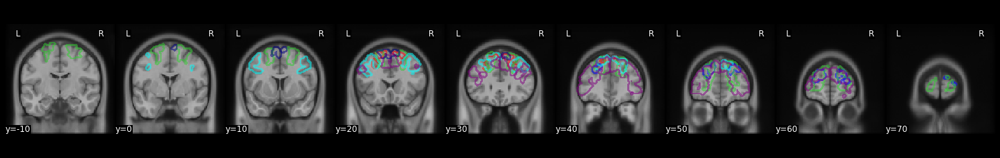

In [217]:
# plot these ROIs onto the brain
fig = plt.figure(figsize=(20,3), facecolor="k")
display = plotting.plot_anat(
    tpl_t1w, display_mode="y", cut_coords=list(range(-10,76,10)), figure=fig
)
masks = [sfg_ju, area9_hcp, sfg_aal,area8_hcp,pfc1_ju,sfl_hcp]
colors = ["red", "blue", "limegreen","cyan","purple","navy"]
for mask, color in zip(masks, colors):
    display.add_contours(
        mask,
        contours=1,
        antialiased=False,
        alpha=0.5,
        linewidth=4.0,
        levels=[0],
        colors=[color],
    )
p1 = Rectangle((0,0), 1, 1, fc="red")
p2 = Rectangle((0,0), 1, 1, fc="blue")
p3 = Rectangle((0,0), 1, 1, fc="limegreen")
p6 = Rectangle((0,0), 1, 1, fc="navy")
# plt.legend([p1, p2, p3,p4,p5,p6], ["julich (area 8d)", "hcp (area 9)", "aal", "hcp (area 8)","julich (frontal I)","hcp (SFL)"],
#            loc="lower right")

plt.show()

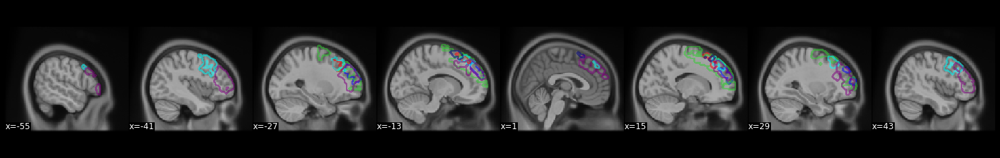

In [216]:
# plot these ROIs onto the brain
fig = plt.figure(figsize=(20,3), facecolor="k")
display = plotting.plot_anat(
    tpl_t1w, display_mode="x", cut_coords=list(range(-55,57,14)), figure=fig
)
masks = [sfg_ju, area9_hcp, sfg_aal,area8_hcp,pfc1_ju,sfl_hcp]
colors = ["red", "blue", "limegreen","cyan","purple","navy"]
for mask, color in zip(masks, colors):
    display.add_contours(
        mask,
        contours=1,
        antialiased=False,
        alpha=0.5,
        linewidth=4.0,
        levels=[0],
        colors=[color],
    )
p1 = Rectangle((0,0), 1, 1, fc="red")
p2 = Rectangle((0,0), 1, 1, fc="blue")
p3 = Rectangle((0,0), 1, 1, fc="limegreen")
p6 = Rectangle((0,0), 1, 1, fc="navy")
# plt.legend([p1, p2, p3,p4,p5,p6], ["julich (area 8d)", "hcp (area 9)", "aal", "hcp (area 8)","julich (frontal I)","hcp (SFL)"],
#            loc="upper left")

plt.show()

### Plot MFG

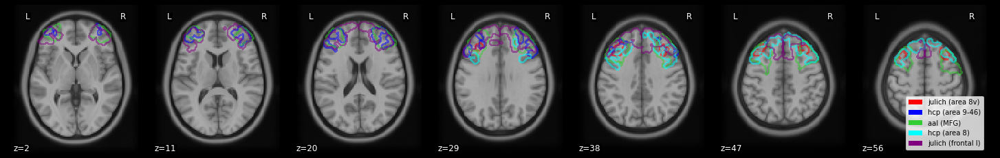

In [21]:
# plot these ROIs onto the brain
fig = plt.figure(figsize=(20,3), facecolor="k")
display = plotting.plot_anat(
    tpl_t1w, display_mode="z", cut_coords=list(range(2,65,9)), figure=fig
)
masks = [mfg_ju, area9_46_hcp, mfg_aal,area8_hcp,pfc1_ju]
colors = ["red", "blue", "limegreen","cyan","purple"]

for mask, color in zip(masks, colors):
    display.add_contours(
        mask,
        contours=1,
        antialiased=False,
        alpha=0.5,
        linewidth=4.0,
        levels=[0],
        colors=[color],
    )
p1 = Rectangle((0,0), 1, 1, fc="red")
p2 = Rectangle((0,0), 1, 1, fc="blue")
p3 = Rectangle((0,0), 1, 1, fc="limegreen")
p4 = Rectangle((0,0), 1, 1, fc="cyan")
p5 = Rectangle((0,0), 1, 1, fc="purple")
plt.legend([p1, p2, p3, p4, p5], 
           ["julich (area 8v)", "hcp (area 9-46)", "aal (MFG)", "hcp (area 8)", "julich (frontal I)"], 
           loc="lower right")
plt.show()


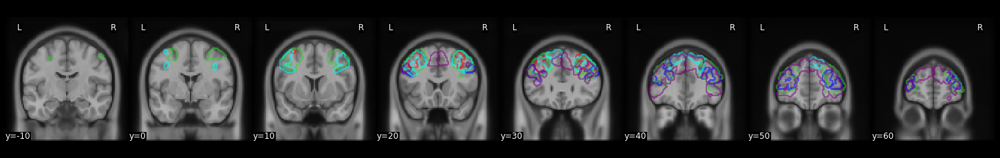

In [235]:
# plot these ROIs onto the brain
fig = plt.figure(figsize=(20,3), facecolor="k")
display = plotting.plot_anat(
    tpl_t1w, display_mode="y", cut_coords=list(range(-10,65,10)), figure=fig
)
masks = [mfg_ju, area9_46_hcp, mfg_aal,area8_hcp,pfc1_ju]
colors = ["red", "blue", "limegreen","cyan","purple"]
for mask, color in zip(masks, colors):
    display.add_contours(
        mask,
        contours=1,
        antialiased=False,
        alpha=0.5,
        linewidth=4.0,
        levels=[0],
        colors=[color],
    )
p1 = Rectangle((0,0), 1, 1, fc="red")
p2 = Rectangle((0,0), 1, 1, fc="blue")
p3 = Rectangle((0,0), 1, 1, fc="limegreen")
p4 = Rectangle((0,0), 1, 1, fc="cyan")
p5 = Rectangle((0,0), 1, 1, fc="purple")
# plt.legend([p1, p2, p3, p4, p5], 
#            ["julich (area 8v)", "hcp (area 9-46)", "aal (MFG)", "hcp (area 8)", "julich (frontal I)"], 
#            loc="best")
plt.show()

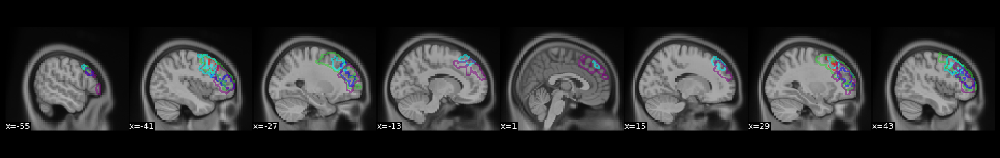

In [236]:
# plot these ROIs onto the brain
fig = plt.figure(figsize=(20,3), facecolor="k")
display = plotting.plot_anat(
    tpl_t1w, display_mode="x", cut_coords=list(range(-55,57,14)), figure=fig
)
masks = [mfg_ju, area9_46_hcp, mfg_aal,area8_hcp,pfc1_ju]
colors = ["red", "blue", "limegreen","cyan","purple"]
for mask, color in zip(masks, colors):
    display.add_contours(
        mask,
        contours=1,
        antialiased=False,
        alpha=0.5,
        linewidth=4.0,
        levels=[0],
        colors=[color],
    )
p1 = Rectangle((0,0), 1, 1, fc="red")
p2 = Rectangle((0,0), 1, 1, fc="blue")
p3 = Rectangle((0,0), 1, 1, fc="limegreen")
p4 = Rectangle((0,0), 1, 1, fc="cyan")
p5 = Rectangle((0,0), 1, 1, fc="purple")
# plt.legend([p1, p2, p3, p4, p5], 
#            ["julich (area 8v)", "hcp (area 9-46)", "aal (MFG)", "hcp (area 8)", "julich (frontal I)"], 
#            loc="best")

plt.show()

### Plot IFG

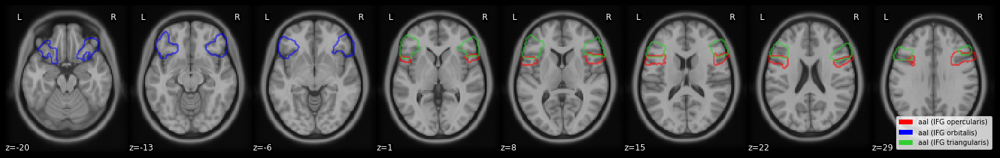

In [17]:
# plot these ROIs onto the brain
fig = plt.figure(figsize=(20,3), facecolor="k")
display = plotting.plot_anat(
    tpl_t1w, display_mode="z", cut_coords=list(range(-20,35,7)), figure=fig
)
masks = [ifg_oper_aal,ifg_orb_aal,ifg_tri_aal]
colors = ["red", "blue", "limegreen"]

for mask, color in zip(masks, colors):
    display.add_contours(
        mask,
        contours=1,
        antialiased=False,
        alpha=0.5,
        linewidth=4.0,
        levels=[0],
        colors=[color],
    )
p1 = Rectangle((0,0), 1, 1, fc="red")
p2 = Rectangle((0,0), 1, 1, fc="blue")
p3 = Rectangle((0,0), 1, 1, fc="limegreen")
p4 = Rectangle((0,0), 1, 1, fc="cyan")
p5 = Rectangle((0,0), 1, 1, fc="purple")
plt.legend([p1, p2, p3, p4, p5], 
           ["aal (IFG opercularis)", "aal (IFG orbitalis)", "aal (IFG triangularis)"], 
           loc="lower right")
plt.show()


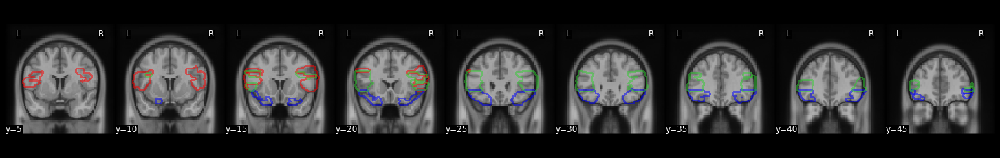

In [19]:
# plot these ROIs onto the brain
fig = plt.figure(figsize=(20,3), facecolor="k")
display = plotting.plot_anat(
    tpl_t1w, display_mode="y", cut_coords=list(range(5,48,5)), figure=fig
)
masks = [ifg_oper_aal,ifg_orb_aal,ifg_tri_aal]
colors = ["red", "blue", "limegreen"]

for mask, color in zip(masks, colors):
    display.add_contours(
        mask,
        contours=1,
        antialiased=False,
        alpha=0.5,
        linewidth=4.0,
        levels=[0],
        colors=[color],
    )
p1 = Rectangle((0,0), 1, 1, fc="red")
p2 = Rectangle((0,0), 1, 1, fc="blue")
p3 = Rectangle((0,0), 1, 1, fc="limegreen")
p4 = Rectangle((0,0), 1, 1, fc="cyan")
p5 = Rectangle((0,0), 1, 1, fc="purple")
# plt.legend([p1, p2, p3, p4, p5], 
#            ["aal (IFG opercularis)", "aal (IFG orbitalis)", "aal (IFG triangularis)"], 
#            loc="lower right")
plt.show()

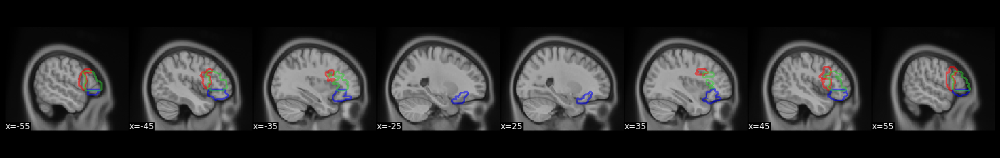

In [21]:
# plot these ROIs onto the brain
fig = plt.figure(figsize=(20,3), facecolor="k")
display = plotting.plot_anat(
    tpl_t1w, display_mode="x", cut_coords=[-55,-45,-35,-25,25,35,45,55], figure=fig
)
masks = [ifg_oper_aal,ifg_orb_aal,ifg_tri_aal]
colors = ["red", "blue", "limegreen"]
for mask, color in zip(masks, colors):
    display.add_contours(
        mask,
        contours=1,
        antialiased=False,
        alpha=0.5,
        linewidth=4.0,
        levels=[0],
        colors=[color],
    )
p1 = Rectangle((0,0), 1, 1, fc="red")
p2 = Rectangle((0,0), 1, 1, fc="blue")
p3 = Rectangle((0,0), 1, 1, fc="limegreen")
p4 = Rectangle((0,0), 1, 1, fc="cyan")
p5 = Rectangle((0,0), 1, 1, fc="purple")
# plt.legend([p1, p2, p3, p4, p5], 
#            ["julich (area 8v)", "hcp (area 9-46)", "aal (MFG)", "hcp (area 8)", "julich (frontal I)"], 
#            loc="best")

plt.show()

# Explore PFC atlases

### PFC SET 1: IFG, MFG and SFG from AAL overlapped with MD atlas

In [4]:
# superior frontal gyrus
sfg_lh_aal = nib.load('atlases/aal/separate_masks/2mm_Frontal_Sup_L.nii')
sfg_rh_aal = nib.load('atlases/aal/separate_masks/2mm_Frontal_Sup_R.nii')
sfg_aal = image.math_img("img1 + img2", img1=sfg_lh_aal, img2=sfg_rh_aal)

# middle frontal gyrus
mfg_lh_aal = nib.load('atlases/aal/separate_masks/2mm_Frontal_Mid_L.nii')
mfg_rh_aal = nib.load('atlases/aal/separate_masks/2mm_Frontal_Mid_R.nii')
mfg_aal = image.math_img("img1 + img2", img1=mfg_lh_aal, img2=mfg_rh_aal)

# inferior frontal gyrus
ifg_oper_lh_aal = nib.load('atlases/aal/separate_masks/2mm_Frontal_Inf_Oper_L.nii')
ifg_oper_rh_aal = nib.load('atlases/aal/separate_masks/2mm_Frontal_Inf_Oper_R.nii')
ifg_orb_lh_aal = nib.load('atlases/aal/separate_masks/2mm_Frontal_Inf_Orb_L.nii')
ifg_orb_rh_aal = nib.load('atlases/aal/separate_masks/2mm_Frontal_Inf_Orb_R.nii')
ifg_tri_lh_aal = nib.load('atlases/aal/separate_masks/2mm_Frontal_Inf_Tri_L.nii')
ifg_tri_rh_aal = nib.load('atlases/aal/separate_masks/2mm_Frontal_Inf_Tri_R.nii')
ifg_oper_aal = image.math_img("img1 + img2", img1=ifg_oper_lh_aal, img2=ifg_oper_rh_aal)
ifg_orb_aal = image.math_img("img1 + img2", img1=ifg_orb_lh_aal, img2=ifg_orb_rh_aal)
ifg_tri_aal = image.math_img("img1 + img2", img1=ifg_tri_lh_aal, img2=ifg_tri_rh_aal)
ifg_aal = image.math_img("img1 + img2 + img3", img1=ifg_oper_aal, img2=ifg_orb_aal, img3=ifg_tri_aal)

In [128]:
# load roi from wang atlas
fef_lh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_FEF_lh_prob25.nii')
fef_rh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_FEF_rh_prob25.nii')
fef_wang = image.math_img("img1 + img2", img1=fef_lh_wang, img2=fef_rh_wang)

In [121]:
# MD atlas: https://imaging.mrc-cbu.cam.ac.uk/imaging/MDsystem
# Load MD network
md = nib.load('atlases/MD/md.nii.gz')

#Fedorenko E, Duncan J, Kanwisher N (2013) Broad domain generality in focal regions of frontal and parietal cortex. 
#Proc Natl Acad Sci U S A 110:16616-16621.

#The units are t-statistics from contrasts that isolate cognitive demand, averaged across the seven tasks. 
#To create a symmetrical volume, data from left and right hemispheres were averaged, then projected back to 
#both hemispheres. The figure below shows the main foci of the multiple demand system when this volume is 
#thresholded at a value of t>1.5. 

#The next figure shows a parcellation into regions of interest (7 of 27 clusters are visible), 
#after thresholding at t>1.5. If a cluster contained multiple peaks that also survived t>2.7, 
#then the larger cluster was subdivided, assigning each voxel to the nearest subregion at the higher threshold. 

md_roi = nib.load('atlases/MD/MDROI.nii')

# # Create thresholded MD network
# md_thresh = image.math_img('img > 2',img=md)

# # Save thresholded MD network
# nib.save(md_thresh, 'roi/md_thresh.nii')

# resample the thresholded md image
t1w = nib.load('atlases/MNI152NLin2009cAsym/tpl-MNI152NLin2009cAsym_res-02_T1w.nii')
print(t1w.shape)
md = image.resample_to_img(source_img=md,target_img=t1w,interpolation='nearest')
md_roi = image.resample_to_img(source_img=md_roi,target_img=t1w,interpolation='nearest')

(97, 115, 97)


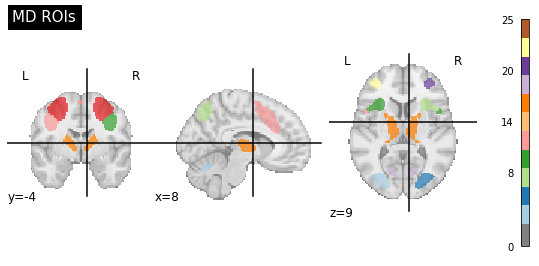

In [122]:
# Plot thresholded MD network
#plotting.view_img(md_roi,threshold=0,title='MD network')
plotting.plot_roi(
    md_roi,
    title="MD ROIs",
    cut_coords=(8, -4, 9),
    colorbar=True,
    cmap="Paired",
)

In [123]:
#roi_val = nilearn.image.get_data(md_roi)
#print(roi_val.shape)
#roi_val = np.round(np.unique(roi_val))
#print(roi_val)

# make the image an integer
md_roi=nilearn.image.math_img('np.round(img)',img=md_roi)
roi_val = nilearn.image.get_data(md_roi)
print(np.unique(roi_val))

# md_roi_1 = nilearn.image.math_img('img(img!=1)=0',img=md_roi)
# print(np.unique(nilearn.image.get_data(md_roi_1)))
#mask = nilearn.maskers.NiftiLabelsMasker(md_roi)

[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11. 12. 13. 14. 15. 16. 17.
 18. 19. 20. 21. 22. 23. 24. 25. 26. 27.]


In [124]:
#print(roi_val_1.astype(int))

In [167]:
md_thresh = image.math_img('img > 1.5',img=md)
sfg_md_aal = image.math_img('img1 & img2',img1=md_thresh,img2=sfg_aal)
mfg_md_aal = image.math_img('img1 & img2',img1=md_thresh,img2=mfg_aal)
ifg_md_aal = image.math_img('img1 & img2',img1=md_thresh,img2=ifg_aal)

In [168]:
#image.get_data(md_thresh).sum()

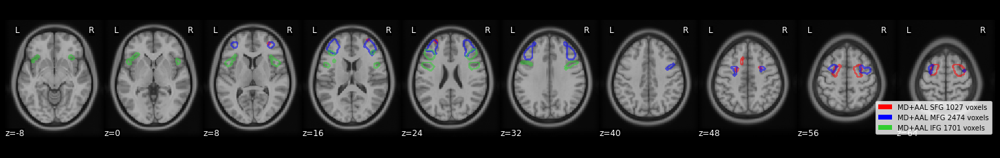

In [169]:
# MD + AAL
# Plot AAL
masks = [sfg_md_aal,mfg_md_aal,ifg_md_aal]
vox_num = []
for mask in masks:
    vox_num_1 = nilearn.image.get_data(mask).sum()
    vox_num.append(vox_num_1)

# plot ROI
fig = plt.figure(figsize=(20,3), facecolor="k")
display = plotting.plot_anat(
    tpl_t1w, display_mode="z", cut_coords=list(range(-8,65,8)), figure=fig 
) #2,65,9
#masks = [mfg_aal, sfg_aal, ifg_aal, fef_wang]
#masks = [img_dil_mfg,img_dil_sfg,img_dil_fef]
colors = ["red", "blue", "limegreen", "cyan"] #,"purple"

for mask, color in zip(masks, colors):
    display.add_contours(
        mask,
        antialiased=False,
        alpha=0.5,
        linewidth=4.0,
        levels=[0],
        colors=[color],
    )
p1 = Rectangle((0,0), 1, 1, fc="red")
p2 = Rectangle((0,0), 1, 1, fc="blue")
p3 = Rectangle((0,0), 1, 1, fc="limegreen")
#p4 = Rectangle((0,0), 1, 1, fc="cyan")
#p5 = Rectangle((0,0), 1, 1, fc="purple")
plt.legend([p1, p2, p3], 
           ["MD+AAL SFG "+str(vox_num[0])+" voxels",
            "MD+AAL MFG "+str(vox_num[1])+" voxels",
            "MD+AAL IFG "+str(vox_num[2])+" voxels"],  #            "WANG FEF "+str(vox_num[3])+" voxels"
           loc="lower right")
plt.show()



/tmp/ipykernel_415171/1468127888.py:14: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  md_roi_2 = image.new_img_like(
/tmp/ipykernel_415171/1468127888.py:18: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  md_roi_3 = image.new_img_like(


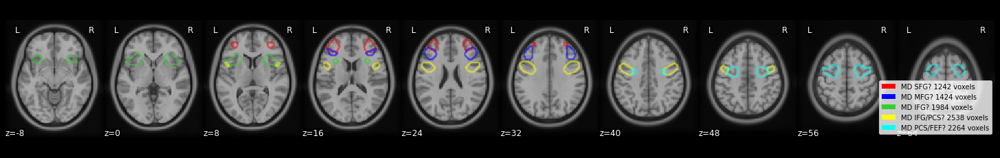

In [170]:
# 5/7: left/right SPL;
# 8/9: left/right IFG; 
# 10/11: left/right MFG; 
# 12: SMA; 
# 13/14: PCS/FEF; 
# 21/23; 
# 22/24: MFG?
masks = []
vox_num = []
vals1 = [8,10,13,21,22]
vals2 = [9,11,14,23,24]
for k in range(5):
    roi_val_2 = roi_val == vals1[k] 
    md_roi_2 = image.new_img_like(
        md_roi, roi_val_2.astype(int)
    )
    roi_val_3 = roi_val == vals2[k] 
    md_roi_3 = image.new_img_like(
        md_roi, roi_val_3.astype(int)
    )
    
    md_roi_1 = nilearn.image.math_img('img1+img2',img1=md_roi_2,img2=md_roi_3)
    vox_num_1 = np.sum(roi_val_2)+np.sum(roi_val_3)
    
    masks.append(md_roi_1)
    vox_num.append(vox_num_1)
    
#plotting.view_img(md_roi_1)

# plot ROI
fig = plt.figure(figsize=(20,3), facecolor="k")
display = plotting.plot_anat(
    tpl_t1w, display_mode="z", cut_coords=list(range(-8,65,8)), figure=fig 
) #2,65,9
#masks = [mfg_aal, sfg_aal, ifg_aal, fef_wang]
#masks = [img_dil_mfg,img_dil_sfg,img_dil_fef]
colors = ["limegreen","yellow","cyan","red","blue"] #"purple"

for mask, color in zip(masks, colors):
    display.add_contours(
        mask,
        antialiased=False,
        alpha=0.5,
        linewidth=4.0,
        levels=[0],
        colors=[color],
    )
p1 = Rectangle((0,0), 1, 1, fc=colors[0])
p2 = Rectangle((0,0), 1, 1, fc=colors[1])
p3 = Rectangle((0,0), 1, 1, fc=colors[2])
p4 = Rectangle((0,0), 1, 1, fc=colors[3])
p5 = Rectangle((0,0), 1, 1, fc=colors[4])
plt.legend([p4, p5, p1, p2, p3], 
           ["MD SFG? "+str(vox_num[3])+" voxels",
            "MD MFG? "+str(vox_num[4])+" voxels",
            "MD IFG? "+str(vox_num[0])+" voxels",
            "MD IFG/PCS? "+str(vox_num[1])+" voxels",
            "MD PCS/FEF? "+str(vox_num[2])+" voxels"], 
           loc="lower right")
plt.show()

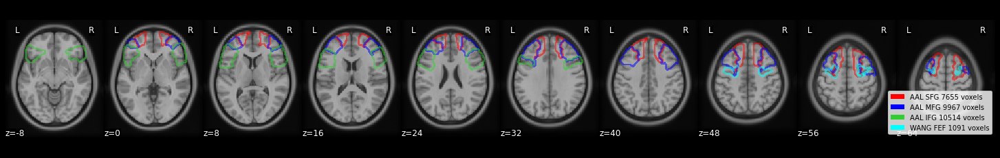

In [151]:
# Plot AAL
masks = [sfg_aal,mfg_aal,ifg_aal,fef_wang]
vox_num = []
for mask in masks:
    vox_num_1 = nilearn.image.get_data(mask).sum()
    vox_num.append(vox_num_1)

# plot ROI
fig = plt.figure(figsize=(20,3), facecolor="k")
display = plotting.plot_anat(
    tpl_t1w, display_mode="z", cut_coords=list(range(-8,65,8)), figure=fig 
) #2,65,9
#masks = [mfg_aal, sfg_aal, ifg_aal, fef_wang]
#masks = [img_dil_mfg,img_dil_sfg,img_dil_fef]
colors = ["red", "blue", "limegreen", "cyan"] #,"purple"

for mask, color in zip(masks, colors):
    display.add_contours(
        mask,
        antialiased=False,
        alpha=0.5,
        linewidth=4.0,
        levels=[0],
        colors=[color],
    )
p1 = Rectangle((0,0), 1, 1, fc="red")
p2 = Rectangle((0,0), 1, 1, fc="blue")
p3 = Rectangle((0,0), 1, 1, fc="limegreen")
p4 = Rectangle((0,0), 1, 1, fc="cyan")
p5 = Rectangle((0,0), 1, 1, fc="purple")
plt.legend([p1, p2, p3,p4], 
           ["AAL SFG "+str(vox_num[0])+" voxels",
            "AAL MFG "+str(vox_num[1])+" voxels",
            "AAL IFG "+str(vox_num[2])+" voxels",
            "WANG FEF "+str(vox_num[3])+" voxels"], 
           loc="lower right")
plt.show()


### PFC set 2: HCP BA areas

In [236]:
# load roi from hcp atlas
# frontal eye field
fef_lh_hcp = nib.load('atlases/HCP/separate_masks/2mm_FEF_L.nii')
fef_rh_hcp = nib.load('atlases/HCP/separate_masks/2mm_FEF_R.nii')
# premotor eye field, not parietal eye field
pef_lh_hcp = nib.load('atlases/HCP/separate_masks/2mm_PEF_L.nii')
pef_rh_hcp = nib.load('atlases/HCP/separate_masks/2mm_PEF_R.nii')

# sfg
sfl_lh_hcp = nib.load('atlases/HCP/separate_masks/2mm_SFL_L.nii')
sfl_rh_hcp = nib.load('atlases/HCP/separate_masks/2mm_SFL_R.nii')

area8bl_lh_hcp = nib.load('atlases/HCP/separate_masks/2mm_8BL_L.nii')
area8bl_rh_hcp = nib.load('atlases/HCP/separate_masks/2mm_8BL_R.nii')
area8ad_lh_hcp = nib.load('atlases/HCP/separate_masks/2mm_8Ad_L.nii')
area8ad_rh_hcp = nib.load('atlases/HCP/separate_masks/2mm_8Ad_R.nii')
area8av_lh_hcp = nib.load('atlases/HCP/separate_masks/2mm_8Av_L.nii')
area8av_rh_hcp = nib.load('atlases/HCP/separate_masks/2mm_8Av_R.nii')
area8c_lh_hcp = nib.load('atlases/HCP/separate_masks/2mm_8C_L.nii')
area8c_rh_hcp = nib.load('atlases/HCP/separate_masks/2mm_8C_R.nii')

area9a_lh_hcp = nib.load('atlases/HCP/separate_masks/2mm_9a_L.nii')
area9a_rh_hcp = nib.load('atlases/HCP/separate_masks/2mm_9a_R.nii')
area9p_lh_hcp = nib.load('atlases/HCP/separate_masks/2mm_9p_L.nii')
area9p_rh_hcp = nib.load('atlases/HCP/separate_masks/2mm_9p_R.nii')

# mfg
area9_46d_lh_hcp = nib.load('atlases/HCP/separate_masks/2mm_9-46d_L.nii')
area9_46d_rh_hcp = nib.load('atlases/HCP/separate_masks/2mm_9-46d_R.nii')
a9_46v_lh_hcp = nib.load('atlases/HCP/separate_masks/2mm_a9-46v_L.nii')
a9_46v_rh_hcp = nib.load('atlases/HCP/separate_masks/2mm_a9-46v_R.nii')
p9_46v_lh_hcp = nib.load('atlases/HCP/separate_masks/2mm_p9-46v_L.nii')
p9_46v_rh_hcp = nib.load('atlases/HCP/separate_masks/2mm_p9-46v_R.nii')

# ifg: 44, 45, 47
area44_lh_hcp = nib.load('atlases/HCP/separate_masks/2mm_44_L.nii')
area44_rh_hcp = nib.load('atlases/HCP/separate_masks/2mm_44_R.nii')
area45_lh_hcp = nib.load('atlases/HCP/separate_masks/2mm_45_L.nii')
area45_rh_hcp = nib.load('atlases/HCP/separate_masks/2mm_45_R.nii')
area47l_lh_hcp = nib.load('atlases/HCP/separate_masks/2mm_47l_L.nii')
area47l_rh_hcp = nib.load('atlases/HCP/separate_masks/2mm_47l_R.nii')

# combine these images
fef_hcp = image.math_img("img1 + img2", img1=fef_lh_hcp, img2=fef_rh_hcp)
pef_hcp = image.math_img("img1 + img2", img1=pef_lh_hcp, img2=pef_rh_hcp)
fpef_hcp = image.math_img("img1 + img2", img1=fef_hcp, img2=pef_hcp)

sfl_hcp = image.math_img("img1 + img2", img1=sfl_lh_hcp, img2=sfl_rh_hcp)
area8_hcp = image.math_img("img1 + img2 + img3 + img4 + img5 + img6 + img7 + img8", 
                         img1=area8bl_lh_hcp, 
                         img2=area8bl_rh_hcp,
                        img3=area8ad_lh_hcp,
                         img4=area8ad_rh_hcp,
                         img5=area8av_lh_hcp,
                         img6=area8av_rh_hcp,
                          img7=area8c_lh_hcp,
                          img8=area8c_rh_hcp)

area9_hcp = image.math_img("img1 + img2 + img3 + img4", 
                         img1=area9a_lh_hcp, 
                         img2=area9a_rh_hcp,
                        img3=area9p_lh_hcp,
                         img4=area9p_rh_hcp)

area9_46_hcp = image.math_img("img1 + img2 + img3 + img4 + img5 + img6", 
                         img1=area9_46d_lh_hcp, 
                         img2=area9_46d_rh_hcp,
                        img3=a9_46v_lh_hcp,
                         img4=a9_46v_rh_hcp,
                         img5=p9_46v_lh_hcp,
                         img6=p9_46v_rh_hcp)

area44_45_47l_hcp = image.math_img("img1 + img2 + img3 + img4 + img5 + img6", 
                         img1=area44_lh_hcp, 
                         img2=area44_rh_hcp,
                        img3=area45_lh_hcp,
                         img4=area45_rh_hcp,
                         img5=area47l_lh_hcp,
                         img6=area47l_rh_hcp)

In [237]:

nib.save(area8_hcp, 'atlases/final_atlas_roi/rsa_atlas_roi/area8_hcp.nii')
nib.save(area9_hcp, 'atlases/final_atlas_roi/rsa_atlas_roi/area9_hcp.nii')
nib.save(area9_46_hcp, 'atlases/final_atlas_roi/rsa_atlas_roi/area9_46_hcp.nii')
nib.save(area44_45_47l_hcp, 'atlases/final_atlas_roi/rsa_atlas_roi/area44_45_47l_hcp.nii')
nib.save(fef_hcp, 'atlases/final_atlas_roi/rsa_atlas_roi/fef_hcp.nii')


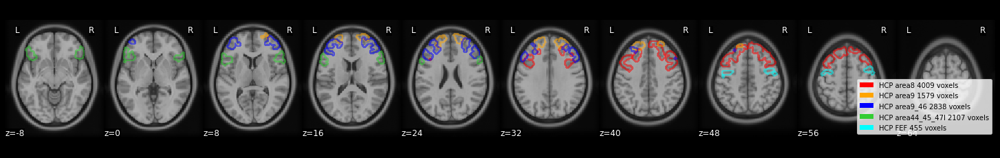

In [152]:
# Plot HCP
masks = [area8_hcp,area9_hcp,area9_46_hcp,area44_45_47l_hcp,fef_hcp] # #sfl_hcp

vox_num = []
for mask in masks:
    vox_num_1 = nilearn.image.get_data(mask).sum()
    vox_num.append(vox_num_1)
    
# plot ROI
fig = plt.figure(figsize=(20,3), facecolor="k")
display = plotting.plot_anat(
    tpl_t1w, display_mode="z", cut_coords=list(range(-8,65,8)), figure=fig 
) #2,65,9
#masks = [mfg_aal, sfg_aal, ifg_aal, fef_wang]
#masks = [img_dil_mfg,img_dil_sfg,img_dil_fef]
colors = [ "red","orange","blue", "limegreen","cyan"] #  "red",   ,"purple" #, "cyan"

for mask, color in zip(masks, colors):
    display.add_contours(
        mask,
        antialiased=False,
        alpha=0.5,
        linewidth=4.0,
        levels=[0],
        colors=[color],
    )
#p1= Rectangle((0,0), 1, 1, fc=colors[0])
#p2 = Rectangle((0,0), 1, 1, fc=colors[0])
p1 = Rectangle((0,0), 1, 1, fc=colors[0])
p2 = Rectangle((0,0), 1, 1, fc=colors[1])
p3 = Rectangle((0,0), 1, 1, fc=colors[2])
p4 = Rectangle((0,0), 1, 1, fc=colors[3])
p5 = Rectangle((0,0), 1, 1, fc=colors[4])
plt.legend([p1,p2,p3,p4,p5],  #p1, p2, 
           ["HCP area8 "+str(vox_num[0])+" voxels",
            "HCP area9 "+str(vox_num[1])+" voxels",
            "HCP area9_46 "+str(vox_num[2])+" voxels",
            "HCP area44_45_47l "+str(vox_num[3])+" voxels",
            "HCP FEF "+str(vox_num[4])+" voxels"],  #
           loc="lower right") #"HCP sfl", 
plt.show()


# Final set of ROI

## MD network ROI

In [232]:
md_roi = nib.load('atlases/MD/MDROI.nii')

# resample the thresholded md image
t1w = nib.load('atlases/MNI152NLin2009cAsym/tpl-MNI152NLin2009cAsym_res-02_T1w.nii')
print(t1w.shape)

md_roi = image.resample_to_img(source_img=md_roi,target_img=t1w,interpolation='nearest')

(97, 115, 97)


In [233]:
# make the image an integer
md_roi=nilearn.image.math_img('np.round(img)',img=md_roi)
roi_val = nilearn.image.get_data(md_roi)
print(np.unique(roi_val))


[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11. 12. 13. 14. 15. 16. 17.
 18. 19. 20. 21. 22. 23. 24. 25. 26. 27.]


In [238]:
masks = []
vox_num = []
vals1 = [21,22,8,10,13,5] # sfg, mfg, ifg, ifg/pcs, pcs/fef
vals2 = [23,24,9,11,14,7]
for k in range(6):
    roi_val_2 = roi_val == vals1[k] 
    md_roi_2 = image.new_img_like(
        md_roi, roi_val_2.astype(int)
    )
    roi_val_3 = roi_val == vals2[k] 
    md_roi_3 = image.new_img_like(
        md_roi, roi_val_3.astype(int)
    )
    
    md_roi_1 = nilearn.image.math_img('img1+img2',img1=md_roi_2,img2=md_roi_3)
    vox_num_1 = np.sum(roi_val_2)+np.sum(roi_val_3)
    
    masks.append(md_roi_1)
    vox_num.append(vox_num_1)
    
print('SFG has '+str(vox_num[0])+' voxels;\n',
      'MFG has '+str(vox_num[1])+' voxels;\n',
      'IFG has '+str(vox_num[2])+' voxels;\n',
      'IFG/PCS has '+str(vox_num[3])+' voxels;\n',
      'PCS/FEF has '+str(vox_num[4])+' voxels;\n',
      'SPL has '+str(vox_num[5])+' voxels;\n')


/tmp/ipykernel_415171/3473725137.py:7: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  md_roi_2 = image.new_img_like(
/tmp/ipykernel_415171/3473725137.py:11: UserWarning: Data array used to create a new image contains 64-bit ints. This is likely due to creating the array with numpy and passing `int` as the `dtype`. Many tools such as FSL and SPM cannot deal with int64 in Nifti images, so for compatibility the data has been converted to int32.
  md_roi_3 = image.new_img_like(


SFG has 1242 voxels;
 MFG has 1424 voxels;
 IFG has 1984 voxels;
 IFG/PCS has 2538 voxels;
 PCS/FEF has 2264 voxels;
 SPL has 8520 voxels;



In [235]:
# save the MD ROI -- for final
nib.save(masks[0], 'atlases/final_atlas_roi/rsa_atlas_roi/amfg_mdroi.nii')
nib.save(masks[1], 'atlases/final_atlas_roi/rsa_atlas_roi/pmfg_mdroi.nii')
nib.save(masks[2], 'atlases/final_atlas_roi/rsa_atlas_roi/ifg_mdroi.nii')
nib.save(masks[3], 'atlases/final_atlas_roi/rsa_atlas_roi/ipcs_mdroi.nii')
nib.save(masks[4], 'atlases/final_atlas_roi/rsa_atlas_roi/spcs_mdroi.nii')


### IFG, MFG and SFG from AAL, FEF from Wang (25%)

In [213]:
fef_lh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_FEF_lh_prob25.nii')
fef_rh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_FEF_rh_prob25.nii')
fef_wang = image.math_img("img1 + img2", img1=fef_lh_wang, img2=fef_rh_wang)

In [27]:
# save AAL ROI
nib.save(mfg_aal, 'atlases/final_atlas_roi/mfg_aal.nii')
nib.save(sfg_aal, 'atlases/final_atlas_roi/sfg_aal.nii')
nib.save(ifg_aal, 'atlases/final_atlas_roi/ifg_aal.nii')
nib.save(fef_wang, 'atlases/final_atlas_roi/fef_wang_prob25.nii')

nib.save(img_dil_mfg, 'atlases/final_atlas_roi/dil_mfg_aal.nii')
nib.save(img_dil_sfg, 'atlases/final_atlas_roi/dil_sfg_aal.nii')
nib.save(img_dil_ifg, 'atlases/final_atlas_roi/dil_ifg_aal.nii')
nib.save(img_dil_fef, 'atlases/final_atlas_roi/dil_fef_wang_prob25.nii')

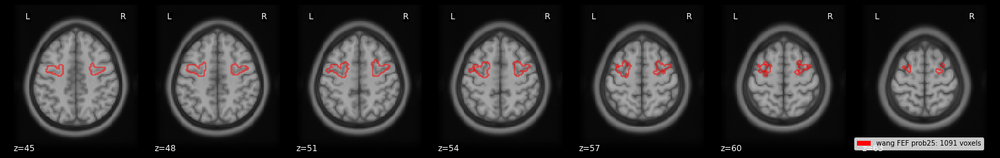

In [217]:
# plot ROI - FEF WANG

fig = plt.figure(figsize=(20,3), facecolor="k")
display = plotting.plot_anat(
    tpl_t1w, display_mode="z", cut_coords=list(range(45,65,3)), figure=fig
)
masks = [fef_wang]
num_vox = image.get_data(masks[0]).sum()
#masks = [img_dil_mfg,img_dil_sfg,img_dil_fef]
colors = ["red", "blue", "limegreen", "cyan"]

for mask, color in zip(masks, colors):
    display.add_contours(
        mask,
        antialiased=False,
        alpha=0.5,
        linewidth=4.0,
        levels=[0],
        colors=[color],
    )
p1 = Rectangle((0,0), 1, 1, fc="red")
p2 = Rectangle((0,0), 1, 1, fc="blue")
p3 = Rectangle((0,0), 1, 1, fc="limegreen")
p4 = Rectangle((0,0), 1, 1, fc="cyan")
p5 = Rectangle((0,0), 1, 1, fc="purple")
plt.legend([p1, p2, p3, p4], 
           ["wang FEF prob25: "+str(num_vox)+" voxels"], 
           loc="lower right")
plt.show()

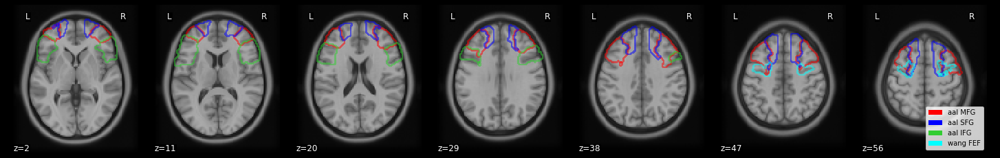

In [30]:
# plot ROI
fig = plt.figure(figsize=(20,3), facecolor="k")
display = plotting.plot_anat(
    tpl_t1w, display_mode="z", cut_coords=list(range(2,65,9)), figure=fig
)
masks = [mfg_aal, sfg_aal, ifg_aal, fef_wang]
#masks = [img_dil_mfg,img_dil_sfg,img_dil_fef]
colors = ["red", "blue", "limegreen", "cyan"]

for mask, color in zip(masks, colors):
    display.add_contours(
        mask,
        antialiased=False,
        alpha=0.5,
        linewidth=4.0,
        levels=[0],
        colors=[color],
    )
p1 = Rectangle((0,0), 1, 1, fc="red")
p2 = Rectangle((0,0), 1, 1, fc="blue")
p3 = Rectangle((0,0), 1, 1, fc="limegreen")
p4 = Rectangle((0,0), 1, 1, fc="cyan")
p5 = Rectangle((0,0), 1, 1, fc="purple")
plt.legend([p1, p2, p3, p4], 
           ["aal MFG", "aal SFG", "aal IFG", "wang FEF"], 
           loc="lower right")
plt.show()

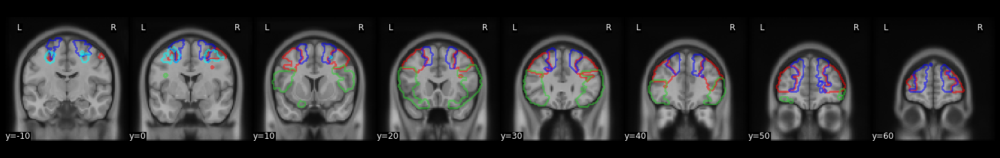

In [31]:
# plot these ROIs onto the brain
fig = plt.figure(figsize=(20,3), facecolor="k")
display = plotting.plot_anat(
    tpl_t1w, display_mode="y", cut_coords=list(range(-10,65,10)), figure=fig
)
masks = [mfg_aal, sfg_aal, ifg_aal, fef_wang]
#masks = [img_dil_mfg,img_dil_sfg,img_dil_fef]
colors = ["red", "blue", "limegreen", "cyan"]

for mask, color in zip(masks, colors):
    display.add_contours(
        mask,
        antialiased=False,
        alpha=0.5,
        linewidth=4.0,
        levels=[0],
        colors=[color],
    )
p1 = Rectangle((0,0), 1, 1, fc="red")
p2 = Rectangle((0,0), 1, 1, fc="blue")
p3 = Rectangle((0,0), 1, 1, fc="limegreen")
p4 = Rectangle((0,0), 1, 1, fc="cyan")
p5 = Rectangle((0,0), 1, 1, fc="purple")
# plt.legend([p1, p2, p3, p4], 
#            ["aal MFG", "aal SFG", "aal IFG","wang FEF"], 
#            loc="lower right")
plt.show()

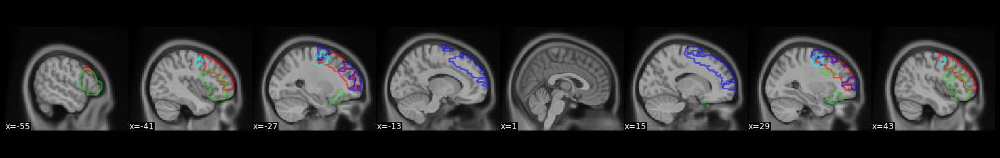

In [32]:
# plot these ROIs onto the brain
fig = plt.figure(figsize=(20,3), facecolor="k")
display = plotting.plot_anat(
    tpl_t1w, display_mode="x", cut_coords=list(range(-55,57,14)), figure=fig
)
masks = [mfg_aal, sfg_aal, ifg_aal, fef_wang]
#masks = [img_dil_mfg,img_dil_sfg,img_dil_fef]
colors = ["red", "blue", "limegreen", "cyan"]

for mask, color in zip(masks, colors):
    display.add_contours(
        mask,
        contours=1,
        antialiased=False,
        alpha=0.5,
        linewidth=4.0,
        levels=[0],
        colors=[color],
    )
p1 = Rectangle((0,0), 1, 1, fc="red")
p2 = Rectangle((0,0), 1, 1, fc="blue")
p3 = Rectangle((0,0), 1, 1, fc="limegreen")
p4 = Rectangle((0,0), 1, 1, fc="cyan")
p5 = Rectangle((0,0), 1, 1, fc="purple")
# plt.legend([p1, p2, p3, p4, p5], 
#            ["julich (area 8v)", "hcp (area 9-46)", "aal (MFG)", "hcp (area 8)", "julich (frontal I)"], 
#            loc="best")

plt.show()

### V1 & V2 from Wang (25%), hOC1 & hOC2 from Julich (50%)

In [228]:
# load roi from wang atlas
v1v_lh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_V1v_lh_prob25.nii')
v1d_lh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_V1d_lh_prob25.nii')
v1v_rh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_V1v_rh_prob25.nii')
v1d_rh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_V1d_rh_prob25.nii')

# we want to combine v1v and v1d for the wang atlas
v1_lh_wang = image.math_img("img1 + img2", img1=v1v_lh_wang,img2=v1d_lh_wang)
v1_rh_wang = image.math_img("img1 + img2", img1=v1v_rh_wang,img2=v1d_rh_wang)
v1_wang = image.math_img("img1 + img2", img1=v1_lh_wang, img2=v1_rh_wang)

In [229]:
# load roi from wang atlas
v2v_lh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_V2v_lh_prob25.nii')
v2d_lh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_V2d_lh_prob25.nii')
v2v_rh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_V2v_rh_prob25.nii')
v2d_rh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_V2d_rh_prob25.nii')

# we want to combine v1v and v1d for the wang atlas
v2_lh_wang = image.math_img("img1 + img2", img1=v2v_lh_wang,img2=v2d_lh_wang)
v2_rh_wang = image.math_img("img1 + img2", img1=v2v_rh_wang,img2=v2d_rh_wang)
v2_wang = image.math_img("img1 + img2", img1=v2_lh_wang, img2=v2_rh_wang)

In [221]:
# save ROIs
nib.save(v1_wang, 'atlases/final_atlas_roi/atlas_roi_for_func_overlap/v1_wang_prob25.nii')
#nib.save(v1_ju, 'atlases/final_atlas_roi/v1_ju_prob50.nii')
nib.save(v2_wang, 'atlases/final_atlas_roi/atlas_roi_for_func_overlap/v2_wang_prob25.nii')
#nib.save(v2_ju, 'atlases/final_atlas_roi/v2_ju_prob50.nii')

In [ ]:
# v1v_lh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_V1v_lh_prob50.nii')
# v1d_lh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_V1d_lh_prob50.nii')
# v1v_rh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_V1v_rh_prob50.nii')
# v1d_rh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_V1d_rh_prob50.nii')

# v2v_lh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_V2v_lh_prob50.nii')
# v2d_lh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_V2d_lh_prob50.nii')
# v2v_rh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_V2v_rh_prob50.nii')
# v2d_rh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_V2d_rh_prob50.nii')

# # we want to combine v1v and v1d for the wang atlas
# v1_lh_wang = image.math_img("img1 + img2", img1=v1v_lh_wang,img2=v1d_lh_wang)
# v1_rh_wang = image.math_img("img1 + img2", img1=v1v_rh_wang,img2=v1d_rh_wang)
# v1_wang = image.math_img("img1 + img2", img1=v1_lh_wang, img2=v1_rh_wang)

# # we want to combine v1v and v1d for the wang atlas
# v2_lh_wang = image.math_img("img1 + img2", img1=v2v_lh_wang,img2=v2d_lh_wang)
# v2_rh_wang = image.math_img("img1 + img2", img1=v2v_rh_wang,img2=v2d_rh_wang)
# v2_wang = image.math_img("img1 + img2", img1=v2_lh_wang, img2=v2_rh_wang)

In [ ]:
# # save ROIs
# nib.save(v1_wang, 'atlases/final_atlas_roi/rsa_atlas_roi_for_func_overlap/v1_wang_prob50.nii')
# #nib.save(v1_ju, 'atlases/final_atlas_roi/v1_ju_prob50.nii')
# nib.save(v2_wang, 'atlases/final_atlas_roi/rsa_atlas_roi_for_func_overlap/v2_wang_prob50.nii')
# #nib.save(v2_ju, 'atlases/final_atlas_roi/v2_ju_prob50.nii')

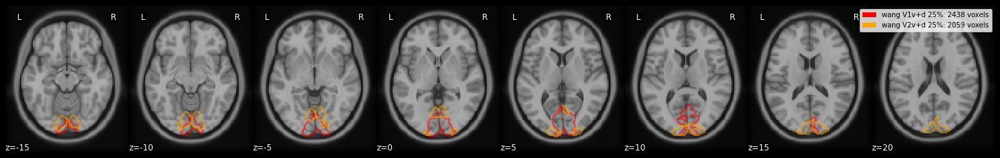

In [230]:
# plot these ROIs onto the brain
fig = plt.figure(figsize=(20,3), facecolor="k")
display = plotting.plot_anat(
    tpl_t1w, display_mode="z", cut_coords=list(range(-15,25,5)), figure=fig
)
masks = [v1_wang, v2_wang]

num_vox = []
for mask in masks:
    num_vox.append(image.get_data(mask).sum())
    
colors = ["red",'orange']
for mask, color in zip(masks, colors):
    display.add_contours(
        mask,
        contours=1,
        antialiased=False,
        alpha=0.5,
        linewidth=4.0,
        levels=[0],
        colors=[color],
    )
p1 = Rectangle((0,0), 1, 1, fc="red")
p2 = Rectangle((0,0), 1, 1, fc="blue")
p3 = Rectangle((0,0), 1, 1, fc="limegreen")
p4 = Rectangle((0,0), 1, 1, fc="orange")
plt.legend([p1, p4], ["wang V1v+d 25%: "+str(num_vox[0])+" voxels",
                      "wang V2v+d 25%: "+str(num_vox[1])+" voxels"], loc="best")

plt.show()

In [231]:
print('Number of overlapping voxels: \n'+
'between v1 and v2: ' +str(image.get_data(image.math_img('img1 & img2',img1=v1_wang,img2=v2_wang)).sum()))

Number of overlapping voxels: 
between v1 and v2: 328


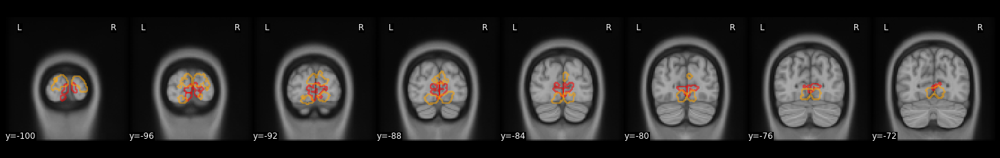

In [434]:
# plot these ROIs onto the brain
fig = plt.figure(figsize=(20,3), facecolor="k")
display = plotting.plot_anat(
    tpl_t1w, display_mode="y", cut_coords=list(range(-100,-70,4)), figure=fig
)
masks = [v1_wang, v2_wang]
colors = ["red",'orange']
for mask, color in zip(masks, colors):
    display.add_contours(
        mask,
        contours=1,
        antialiased=False,
        alpha=0.5,
        linewidth=4.0,
        levels=[0],
        colors=[color],
    )
p1 = Rectangle((0,0), 1, 1, fc="red")
p2 = Rectangle((0,0), 1, 1, fc="blue")
p3 = Rectangle((0,0), 1, 1, fc="limegreen")
p4 = Rectangle((0,0), 1, 1, fc="orange")
#plt.legend([p1, p2, p3, p4], ["julich hOc1 50%", "hcp V1", "aal V1", "wang V1v+d 50%"], loc="best")

plt.show()

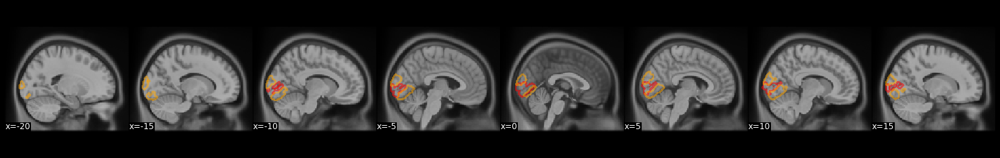

In [435]:
# plot these ROIs onto the brain
fig = plt.figure(figsize=(20,3), facecolor="k")
display = plotting.plot_anat(
    tpl_t1w, display_mode="x", cut_coords=list(range(-20,20,10)), figure=fig
)
masks = [v1_wang, v2_wang]
colors = ["red",'orange']
for mask, color in zip(masks, colors):
    display.add_contours(
        mask,
        contours=1,
        antialiased=False,
        alpha=0.5,
        linewidth=4.0,
        levels=[0],
        colors=[color],
    )
p1 = Rectangle((0,0), 1, 1, fc="red")
p2 = Rectangle((0,0), 1, 1, fc="blue")
p3 = Rectangle((0,0), 1, 1, fc="limegreen")
p4 = Rectangle((0,0), 1, 1, fc="orange")
#plt.legend([p1, p2, p3, p4], ["julich hOc1 50%", "hcp V1", "aal V1", "wang V1v+d 50%"], loc="best")

plt.show()

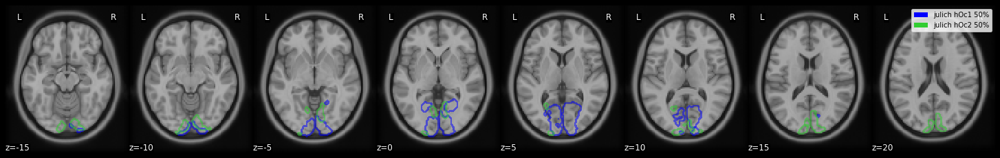

In [436]:
# plot these ROIs onto the brain
fig = plt.figure(figsize=(20,3), facecolor="k")
display = plotting.plot_anat(
    tpl_t1w, display_mode="z", cut_coords=list(range(-15,25,5)), figure=fig
)
masks = [v1_ju, v2_ju]
colors = ["blue", "limegreen"]
for mask, color in zip(masks, colors):
    display.add_contours(
        mask,
        contours=1,
        antialiased=False,
        alpha=0.5,
        linewidth=4.0,
        levels=[0],
        colors=[color],
    )
p1 = Rectangle((0,0), 1, 1, fc="red")
p2 = Rectangle((0,0), 1, 1, fc="blue")
p3 = Rectangle((0,0), 1, 1, fc="limegreen")
p4 = Rectangle((0,0), 1, 1, fc="orange")
plt.legend([p2, p3], ["julich hOc1 50%", "julich hOc2 50%"], loc="best")

plt.show()

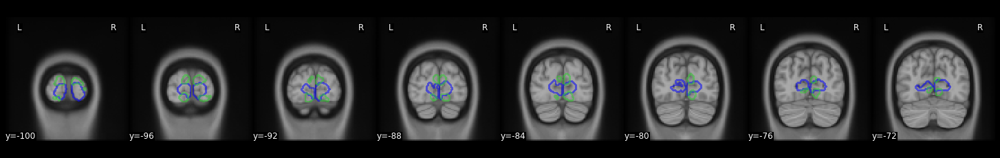

In [437]:
# plot these ROIs onto the brain
fig = plt.figure(figsize=(20,3), facecolor="k")
display = plotting.plot_anat(
    tpl_t1w, display_mode="y", cut_coords=list(range(-100,-70,4)), figure=fig
)
masks = [v1_ju, v2_ju]
colors = ["blue", "limegreen"]
for mask, color in zip(masks, colors):
    display.add_contours(
        mask,
        contours=1,
        antialiased=False,
        alpha=0.5,
        linewidth=4.0,
        levels=[0],
        colors=[color],
    )
p1 = Rectangle((0,0), 1, 1, fc="red")
p2 = Rectangle((0,0), 1, 1, fc="blue")
p3 = Rectangle((0,0), 1, 1, fc="limegreen")
p4 = Rectangle((0,0), 1, 1, fc="orange")
#plt.legend([p1, p2, p3, p4], ["julich hOc1 50%", "hcp V1", "aal V1", "wang V1v+d 50%"], loc="best")

plt.show()

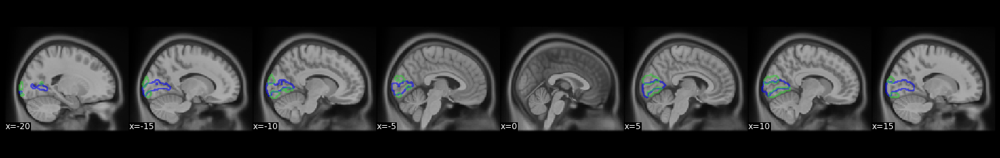

In [438]:
# plot these ROIs onto the brain
fig = plt.figure(figsize=(20,3), facecolor="k")
display = plotting.plot_anat(
    tpl_t1w, display_mode="x", cut_coords=[-30,-25,-20,-15,15,20,25,30], figure=fig
)
masks = [v1_ju, v2_ju]
colors = ["blue", "limegreen"]
for mask, color in zip(masks, colors):
    display.add_contours(
        mask,
        contours=1,
        antialiased=False,
        alpha=0.5,
        linewidth=4.0,
        levels=[0],
        colors=[color],
    )
p1 = Rectangle((0,0), 1, 1, fc="red")
p2 = Rectangle((0,0), 1, 1, fc="blue")
p3 = Rectangle((0,0), 1, 1, fc="limegreen")
p4 = Rectangle((0,0), 1, 1, fc="orange")
#plt.legend([p1, p2, p3, p4], ["julich hOc1 50%", "hcp V1", "aal V1", "wang V1v+d 50%"], loc="best")

plt.show()

### IPS wang 15%

In [182]:
# load roi from wang atlas
ips0_lh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_IPS0_lh_prob15.nii')
ips1_lh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_IPS1_lh_prob15.nii')
ips2_lh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_IPS2_lh_prob15.nii')
ips3_lh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_IPS3_lh_prob15.nii')
ips4_lh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_IPS4_lh_prob15.nii')
ips5_lh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_IPS5_lh_prob15.nii')
spl1_lh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_SPL1_lh_prob15.nii')

ips0_rh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_IPS0_rh_prob15.nii')
ips1_rh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_IPS1_rh_prob15.nii')
ips2_rh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_IPS2_rh_prob15.nii')
ips3_rh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_IPS3_rh_prob15.nii')
ips4_rh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_IPS4_rh_prob15.nii')
ips5_rh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_IPS5_rh_prob15.nii')
spl1_rh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_SPL1_rh_prob15.nii')

In [183]:
# we want to combine areas
ips0_wang = image.math_img("img1 + img2", img1=ips0_lh_wang,img2=ips0_rh_wang)
ips1_wang = image.math_img("img1 + img2", img1=ips1_lh_wang,img2=ips1_rh_wang)
ips2_wang = image.math_img("img1 + img2", img1=ips2_lh_wang,img2=ips2_rh_wang)
ips3_wang = image.math_img("img1 + img2", img1=ips3_lh_wang,img2=ips3_rh_wang)
ips4_wang = image.math_img("img1 + img2", img1=ips4_lh_wang,img2=ips4_rh_wang)
ips5_wang = image.math_img("img1 + img2", img1=ips5_lh_wang,img2=ips5_rh_wang)
spl1_wang = image.math_img("img1 + img2", img1=spl1_lh_wang,img2=spl1_rh_wang)

ips_lh_wang = image.math_img("img1+img2+img3+img4+img5+img6", 
                             img1=ips0_lh_wang,img2=ips1_lh_wang,
                            img3=ips2_lh_wang,img4=ips3_lh_wang,
                            img5=ips4_lh_wang,img6=ips5_lh_wang)
ips_rh_wang = image.math_img("img1+img2+img3+img4+img5+img6", 
                             img1=ips0_rh_wang,img2=ips1_rh_wang,
                            img3=ips2_rh_wang,img4=ips3_rh_wang,
                            img5=ips4_rh_wang,img6=ips5_rh_wang)
ips_wang = image.math_img("img1 + img2", img1=ips_lh_wang,img2=ips_rh_wang)
spl1_wang = image.math_img("img1 + img2", img1=spl1_lh_wang, img2=spl1_rh_wang)

ips012_lh_wang = image.math_img("img1+img2+img3", 
                             img1=ips0_lh_wang,img2=ips1_lh_wang,
                            img3=ips2_lh_wang)
ips345_lh_wang = image.math_img("img1+img2+img3", 
                             img1=ips3_lh_wang,img2=ips4_lh_wang,
                            img3=ips5_lh_wang)
ips012_rh_wang = image.math_img("img1+img2+img3", 
                             img1=ips0_rh_wang,img2=ips1_rh_wang,
                            img3=ips2_rh_wang)
ips345_rh_wang = image.math_img("img1+img2+img3", 
                             img1=ips3_rh_wang,img2=ips4_rh_wang,
                            img3=ips5_rh_wang)
ips012_wang = image.math_img("img1 + img2", img1=ips012_lh_wang,img2=ips012_rh_wang)
ips345_wang = image.math_img("img1 + img2", img1=ips345_lh_wang,img2=ips345_rh_wang)

ips012spl1_wang = image.math_img("img1 + img2", img1=ips012_wang,img2=spl1_wang)

lparietal_wang = image.math_img("img1 + img2", img1=ips_wang,img2=spl1_wang)

In [471]:
nib.save(lparietal_wang, 'atlases/final_atlas_roi/lparietal_wang_prob15.nii')

In [184]:
nib.save(ips0_wang, 'atlases/final_atlas_roi/ips0_wang_prob15.nii')
nib.save(ips1_wang, 'atlases/final_atlas_roi/ips1_wang_prob15.nii')
nib.save(ips2_wang, 'atlases/final_atlas_roi/ips2_wang_prob15.nii')
nib.save(ips3_wang, 'atlases/final_atlas_roi/ips3_wang_prob15.nii')
nib.save(ips4_wang, 'atlases/final_atlas_roi/ips4_wang_prob15.nii')
nib.save(ips5_wang, 'atlases/final_atlas_roi/ips5_wang_prob15.nii')
nib.save(spl1_wang, 'atlases/final_atlas_roi/spl1_wang_prob15.nii')


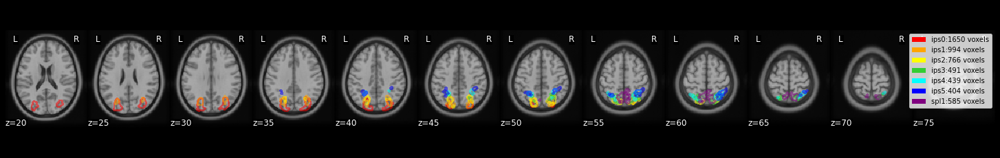

In [192]:
# plot these ROIs onto the brain
masks = [ips0_wang,ips1_wang,ips2_wang,ips3_wang,ips4_wang,ips5_wang,spl1_wang]#, spl1_wang]
vox_num = []
for mask in masks:
    vox_num_1 = nilearn.image.get_data(mask).sum()
    vox_num.append(vox_num_1)
    
fig = plt.figure(figsize=(20,3), facecolor="k")
display = plotting.plot_anat(
    tpl_t1w, display_mode="z", cut_coords=list(range(20,80,5)), figure=fig
)

colors = ["red","orange","yellow","limegreen","cyan","blue","purple"]#, "limegreen"] #,'orange'
p = []
for mask, color in zip(masks, colors):
    display.add_contours(
        mask,
        contours=1,
        antialiased=False,
        alpha=0.5,
        linewidth=4.0,
        levels=[0],
        colors=[color],
    )
    p.append(Rectangle((0,0), 1, 1, fc=color))

plt.legend([p[0],p[1],p[2],p[3],p[4],p[5],p[6]], 
           ["ips0:"+str(vox_num[0])+" voxels",
            "ips1:"+str(vox_num[1])+" voxels",
            "ips2:"+str(vox_num[2])+" voxels",
            "ips3:"+str(vox_num[3])+" voxels",
            "ips4:"+str(vox_num[4])+" voxels",
            "ips5:"+str(vox_num[5])+" voxels",
            "spl1:"+str(vox_num[6])+" voxels"], loc="best") #, "wang spl" , p3

plt.show()

In [196]:
print(str(image.get_data(image.math_img('img1 & img2',img1=ips1_wang,img2=ips2_wang)).sum()))

252


In [201]:
print('Number of overlapping voxels: \n'+
'between ips0 and ips1: ' +str(image.get_data(image.math_img('img1 & img2',img1=ips0_wang,img2=ips1_wang)).sum())
      +'\n'+
'between ips1 and ips2: '+str(image.get_data(image.math_img('img1 & img2',img1=ips1_wang,img2=ips2_wang)).sum())
      +'\n'+
'between ips2 and ips3: '+str(image.get_data(image.math_img('img1 & img2',img1=ips2_wang,img2=ips3_wang)).sum())
      +'\n'+
'between ips3 and ips4: '+str(image.get_data(image.math_img('img1 & img2',img1=ips3_wang,img2=ips4_wang)).sum())
      +'\n'+
'between ips4 and ips5: '+str(image.get_data(image.math_img('img1 & img2',img1=ips4_wang,img2=ips5_wang)).sum())
      +'\n'+
'between ips5 and spl1: '+str(image.get_data(image.math_img('img1 & img2',img1=ips5_wang,img2=spl1_wang)).sum())
      +'\n')

Number of overlapping voxels: 
between ips0 and ips1: 470
between ips1 and ips2: 252
between ips2 and ips3: 94
between ips3 and ips4: 121
between ips4 and ips5: 124
between ips5 and spl1: 0



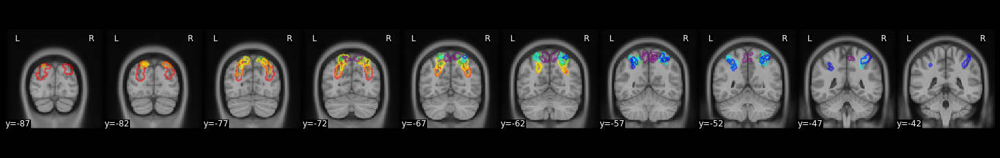

In [202]:
# plot these ROIs onto the brain
masks = [ips0_wang,ips1_wang,ips2_wang,ips3_wang,ips4_wang,ips5_wang,spl1_wang]#, spl1_wang]

fig = plt.figure(figsize=(20,3), facecolor="k")
display = plotting.plot_anat(
    tpl_t1w, display_mode="y", cut_coords=list(range(-87,-40,5)), figure=fig
)

colors = ["red","orange","yellow","limegreen","cyan","blue","purple"]#, "limegreen"] #,'orange'
p = []
for mask, color in zip(masks, colors):
    display.add_contours(
        mask,
        contours=1,
        antialiased=False,
        alpha=0.5,
        linewidth=4.0,
        levels=[0],
        colors=[color],
    )
    p.append(Rectangle((0,0), 1, 1, fc=color))

plt.show()

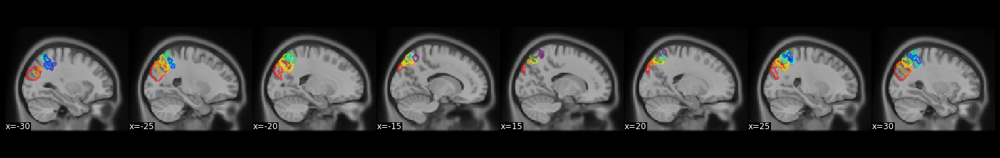

In [203]:
# plot these ROIs onto the brain
masks = [ips0_wang,ips1_wang,ips2_wang,ips3_wang,ips4_wang,ips5_wang,spl1_wang]#, spl1_wang]
    
fig = plt.figure(figsize=(20,3), facecolor="k")
display = plotting.plot_anat(
    tpl_t1w, display_mode="x", cut_coords=[-30,-25,-20,-15,15,20,25,30], figure=fig
)

colors = ["red","orange","yellow","limegreen","cyan","blue","purple"]#, "limegreen"] #,'orange'
p = []
for mask, color in zip(masks, colors):
    display.add_contours(
        mask,
        contours=1,
        antialiased=False,
        alpha=0.5,
        linewidth=4.0,
        levels=[0],
        colors=[color],
    )
    p.append(Rectangle((0,0), 1, 1, fc=color))

plt.show()

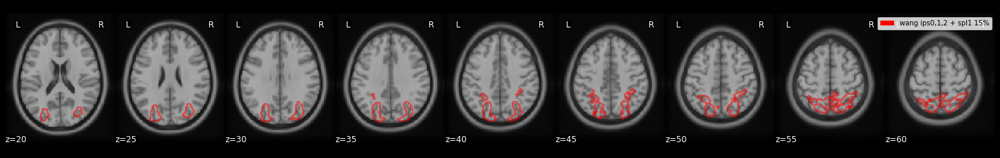

In [472]:
# plot these ROIs onto the brain
fig = plt.figure(figsize=(20,3), facecolor="k")
display = plotting.plot_anat(
    tpl_t1w, display_mode="z", cut_coords=list(range(20,65,5)), figure=fig
)
masks = [lparietal_wang]#, spl1_wang]
colors = ["red"]#, "limegreen"] #,'orange'
for mask, color in zip(masks, colors):
    display.add_contours(
        mask,
        contours=1,
        antialiased=False,
        alpha=0.5,
        linewidth=4.0,
        levels=[0],
        colors=[color],
    )
p1 = Rectangle((0,0), 1, 1, fc="red")
p2 = Rectangle((0,0), 1, 1, fc="blue")
p3 = Rectangle((0,0), 1, 1, fc="limegreen")
p4 = Rectangle((0,0), 1, 1, fc="orange")
plt.legend([p1], ["wang ips0,1,2 + spl1 15%"], loc="best") #, "wang spl" , p3

plt.show()

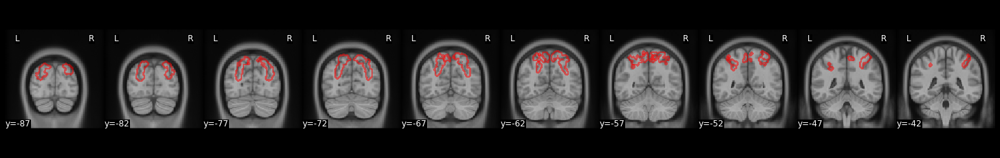

In [473]:
# plot these ROIs onto the brain
fig = plt.figure(figsize=(20,3), facecolor="k")
display = plotting.plot_anat(
    tpl_t1w, display_mode="y", cut_coords=list(range(-87,-40,5)), figure=fig
)
masks = [lparietal_wang]#, spl1_wang]
colors = ["red"]#, "limegreen"] #,'orange'
for mask, color in zip(masks, colors):
    display.add_contours(
        mask,
        contours=1,
        antialiased=False,
        alpha=0.5,
        linewidth=4.0,
        levels=[0],
        colors=[color],
    )
p1 = Rectangle((0,0), 1, 1, fc="red")
p2 = Rectangle((0,0), 1, 1, fc="blue")
p3 = Rectangle((0,0), 1, 1, fc="limegreen")
p4 = Rectangle((0,0), 1, 1, fc="orange")
#plt.legend([p1, p2], ["wang ips0,1,2 + spl1", "wang ips3,4,5"], loc="best") #, "wang spl" , p3

plt.show()

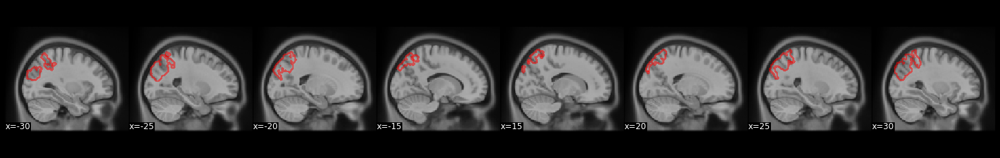

In [474]:
# plot these ROIs onto the brain
fig = plt.figure(figsize=(20,3), facecolor="k")
display = plotting.plot_anat(
    tpl_t1w, display_mode="x", cut_coords=[-30,-25,-20,-15,15,20,25,30], figure=fig
)
masks = [lparietal_wang]#, spl1_wang]
colors = ["red"]#, "limegreen"] #,'orange'
for mask, color in zip(masks, colors):
    display.add_contours(
        mask,
        contours=1,
        antialiased=False,
        alpha=0.5,
        linewidth=4.0,
        levels=[0],
        colors=[color],
    )
p1 = Rectangle((0,0), 1, 1, fc="red")
p2 = Rectangle((0,0), 1, 1, fc="blue")
p3 = Rectangle((0,0), 1, 1, fc="limegreen")
p4 = Rectangle((0,0), 1, 1, fc="orange")
#plt.legend([p1, p2], ["wang ips0,1,2 + spl1", "wang ips3,4,5"], loc="lower right") #, "wang spl" , p3

plt.show()

### primary motor cortex Julich 50%

In [212]:
# load roi from jubrain atlas
# primary motor cortex
area4a_lh_ju  = nib.load('atlases/jubrain/separate_masks/2mm_Area 4a (PreCG) left_prob50.nii')
area4a_rh_ju  = nib.load('atlases/jubrain/separate_masks/2mm_Area 4a (PreCG) right_prob50.nii')
area4p_lh_ju  = nib.load('atlases/jubrain/separate_masks/2mm_Area 4p (PreCG) left_prob50.nii')
area4p_rh_ju  = nib.load('atlases/jubrain/separate_masks/2mm_Area 4p (PreCG) right_prob50.nii')

area4_ju = image.math_img("img1+img2+img3+img4",
                        img1=area4a_lh_ju, img2=area4a_rh_ju,
                        img3=area4p_lh_ju, img4=area4p_rh_ju)

In [498]:
nib.save(area4_ju, 'atlases/final_atlas_roi/area4_ju_prob50.nii')

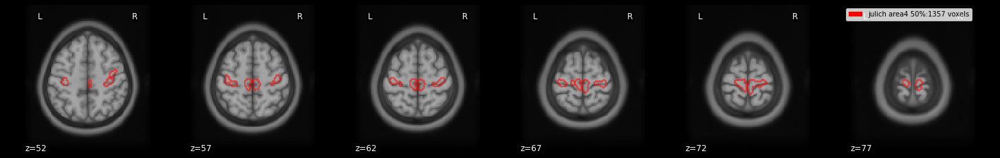

In [210]:
fig = plt.figure(figsize=(20,3), facecolor="k")
display = plotting.plot_anat(
    tpl_t1w, display_mode="z", cut_coords=list(range(52,82,5)), figure=fig
)
masks = [area4_ju]
num_vox = image.get_data(area4_ju).sum()

colors = ["red", "blue", "limegreen",'orange']
for mask, color in zip(masks, colors):
    display.add_contours(
        mask,
        contours=1,
        antialiased=False,
        alpha=0.5,
        linewidth=4.0,
        levels=[0],
        colors=[color],
    )
p1 = Rectangle((0,0), 1, 1, fc="red")
p2 = Rectangle((0,0), 1, 1, fc="blue")
p3 = Rectangle((0,0), 1, 1, fc="limegreen")
p4 = Rectangle((0,0), 1, 1, fc="orange")
plt.legend([p1], ["julich area4 50%:"+str(num_vox.astype(int))+" voxels"], loc="best")

plt.show()

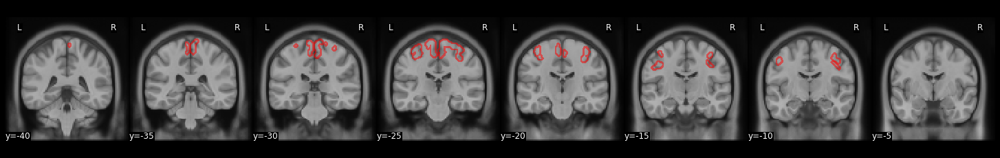

In [500]:
# plot these ROIs onto the brain
fig = plt.figure(figsize=(20,3), facecolor="k")
display = plotting.plot_anat(
    tpl_t1w, display_mode="y", cut_coords=list(range(-40,0,5)), figure=fig
)
masks = [area4_ju]
colors = ["red", "blue", "limegreen",'orange']
for mask, color in zip(masks, colors):
    display.add_contours(
        mask,
        contours=1,
        antialiased=False,
        alpha=0.5,
        linewidth=4.0,
        levels=[0],
        colors=[color],
    )

plt.show()

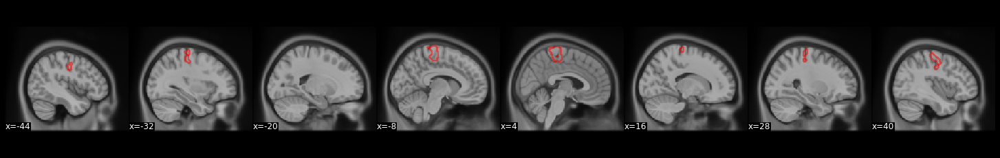

In [501]:
# plot these ROIs onto the brain
fig = plt.figure(figsize=(20,3), facecolor="k")
display = plotting.plot_anat(
    tpl_t1w, display_mode="x", cut_coords=list(range(-44,44,12)), figure=fig
)
masks = [area4_ju]
colors = ["red", "blue", "limegreen",'orange']
for mask, color in zip(masks, colors):
    display.add_contours(
        mask,
        contours=1,
        antialiased=False,
        alpha=0.5,
        linewidth=4.0,
        levels=[0],
        colors=[color],
    )

plt.show()

In [ ]:
# fef

In [285]:
# load roi from wang atlas
fef_lh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_FEF_lh_maxprob.nii')
fef_rh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_FEF_rh_maxprob.nii')
fef_wang = image.math_img("img1 + img2", img1=fef_lh_wang, img2=fef_rh_wang)

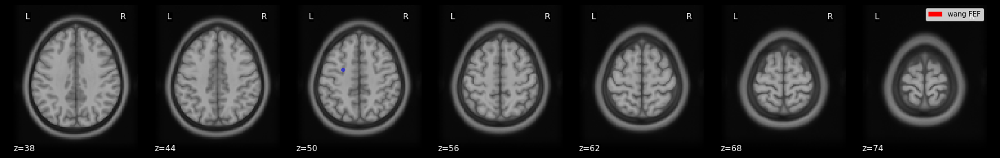

In [286]:
# plot these ROIs onto the brain
fig = plt.figure(figsize=(20,3), facecolor="k")
display = plotting.plot_anat(
    tpl_t1w, display_mode="z", cut_coords=list(range(38,80,6)), figure=fig
)
masks = [fef_wang]
colors = ["blue"]#,'orange']
for mask, color in zip(masks, colors):
    display.add_contours(
        mask,
        contours=1,
        antialiased=False,
        alpha=0.5,
        linewidth=4.0,
        levels=[0],
        colors=[color],
    )
p1 = Rectangle((0,0), 1, 1, fc="red")
p2 = Rectangle((0,0), 1, 1, fc="blue")
p3 = Rectangle((0,0), 1, 1, fc="limegreen")
p4 = Rectangle((0,0), 1, 1, fc="orange")
plt.legend([p1], ["wang FEF"], loc="best")

plt.show()

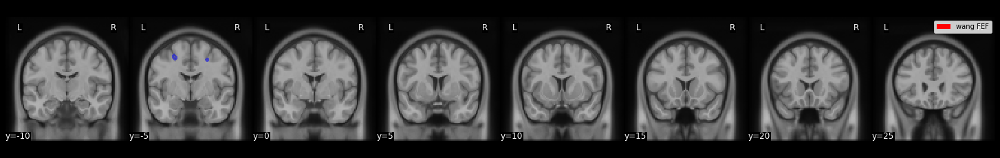

In [287]:
# plot these ROIs onto the brain
fig = plt.figure(figsize=(20,3), facecolor="k")
display = plotting.plot_anat(
    tpl_t1w, display_mode="y", cut_coords=list(range(-10, 30,5)), figure=fig
)
masks = [fef_wang]
colors = ["blue"]#,'orange']
for mask, color in zip(masks, colors):
    display.add_contours(
        mask,
        contours=1,
        antialiased=False,
        alpha=0.5,
        linewidth=4.0,
        levels=[0],
        colors=[color],
    )
p1 = Rectangle((0,0), 1, 1, fc="red")
p2 = Rectangle((0,0), 1, 1, fc="blue")
p3 = Rectangle((0,0), 1, 1, fc="limegreen")
p4 = Rectangle((0,0), 1, 1, fc="orange")
plt.legend([p1], ["wang FEF"], loc="best")

plt.show()

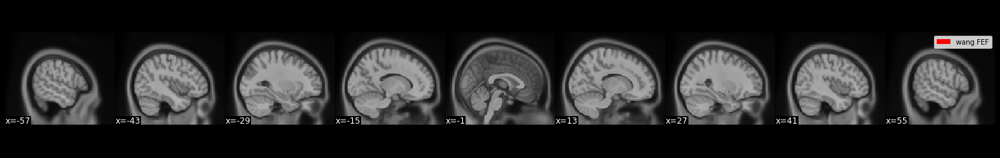

In [290]:
# plot these ROIs onto the brain
fig = plt.figure(figsize=(20,3), facecolor="k")
display = plotting.plot_anat(
    tpl_t1w, display_mode="x", cut_coords=list(range(-57,57,14)), figure=fig
)
masks = [fef_wang]
colors = ["blue"]#,'orange']
for mask, color in zip(masks, colors):
    display.add_contours(
        mask,
        contours=1,
        antialiased=False,
        alpha=0.5,
        linewidth=4.0,
        levels=[0],
        colors=[color],
    )
p1 = Rectangle((0,0), 1, 1, fc="red")
p2 = Rectangle((0,0), 1, 1, fc="blue")
p3 = Rectangle((0,0), 1, 1, fc="limegreen")
p4 = Rectangle((0,0), 1, 1, fc="orange")
plt.legend([p1], ["wang FEF"], loc="best")

plt.show()

# 80% probability wang atlas

In [291]:
# Maximum probability map V1 and V2
v1v_lh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_V1v_lh_prob85.nii')
v1d_lh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_V1d_lh_prob85.nii')
v1v_rh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_V1v_rh_prob85.nii')
v1d_rh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_V1d_rh_prob85.nii')

# # we want to combine v1v and v1d for the wang atlas
v1_lh_wang = image.math_img("img1 + img2", img1=v1v_lh_wang,img2=v1d_lh_wang)
v1_rh_wang = image.math_img("img1 + img2", img1=v1v_rh_wang,img2=v1d_rh_wang)
v1_wang = image.math_img("img1 + img2", img1=v1_lh_wang, img2=v1_rh_wang)

# load roi from wang atlas
v2v_lh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_V2v_lh_prob85.nii')
v2d_lh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_V2d_lh_prob85.nii')
v2v_rh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_V2v_rh_prob85.nii')
v2d_rh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_V2d_rh_prob85.nii')

# we want to combine v1v and v1d for the wang atlas
v2_lh_wang = image.math_img("img1 + img2", img1=v2v_lh_wang,img2=v2d_lh_wang)
v2_rh_wang = image.math_img("img1 + img2", img1=v2v_rh_wang,img2=v2d_rh_wang)
v2_wang = image.math_img("img1 + img2", img1=v2_lh_wang, img2=v2_rh_wang)


# load roi from wang atlas
v3v_lh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_V3v_lh_prob85.nii')
v3d_lh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_V3d_lh_prob85.nii')
v3v_rh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_V3v_rh_prob85.nii')
v3d_rh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_V3d_rh_prob85.nii')

# we want to combine v1v and v1d for the wang atlas
v3_lh_wang = image.math_img("img1 + img2", img1=v3v_lh_wang,img2=v3d_lh_wang)
v3_rh_wang = image.math_img("img1 + img2", img1=v3v_rh_wang,img2=v3d_rh_wang)
v3_wang = image.math_img("img1 + img2", img1=v3_lh_wang, img2=v3_rh_wang)


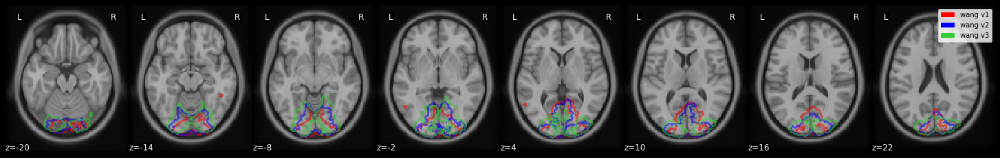

In [292]:
# plot these ROIs onto the brain
fig = plt.figure(figsize=(20,3), facecolor="k")
display = plotting.plot_anat(
    tpl_t1w, display_mode="z", cut_coords=list(range(-20,25,6)), figure=fig
)
masks = [v1_wang, v2_wang, v3_wang]
colors = ["red", "blue","limegreen"]#, ,'orange']
for mask, color in zip(masks, colors):
    display.add_contours(
        mask,
        contours=1,
        antialiased=False,
        alpha=0.5,
        linewidth=4.0,
        levels=[0],
        colors=[color],
    )#        
p1 = Rectangle((0,0), 1, 1, fc="red")
p2 = Rectangle((0,0), 1, 1, fc="blue")
p3 = Rectangle((0,0), 1, 1, fc="limegreen")
#p4 = Rectangle((0,0), 1, 1, fc="orange")
plt.legend([p1, p2, p3], ["wang v1", "wang v2", "wang v3"], loc="best")

plt.show()

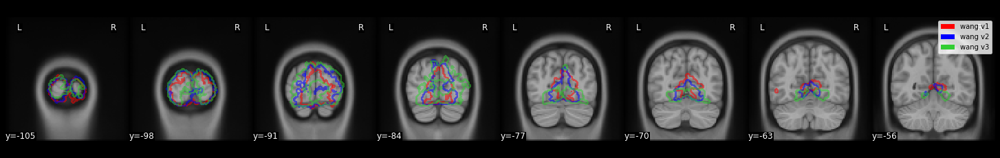

In [293]:
# plot these ROIs onto the brain
fig = plt.figure(figsize=(20,3), facecolor="k")
display = plotting.plot_anat(
    tpl_t1w, display_mode="y", cut_coords=list(range(-105,-50,7)), figure=fig
)
masks = [v1_wang, v2_wang, v3_wang]
colors = ["red", "blue","limegreen"]#, ,'orange']
for mask, color in zip(masks, colors):
    display.add_contours(
        mask,
        contours=1,
        antialiased=False,
        alpha=0.5,
        linewidth=4.0,
        levels=[0],
        colors=[color],
    )
p1 = Rectangle((0,0), 1, 1, fc="red")
p2 = Rectangle((0,0), 1, 1, fc="blue")
p3 = Rectangle((0,0), 1, 1, fc="limegreen")
p4 = Rectangle((0,0), 1, 1, fc="orange")
plt.legend([p1, p2, p3], ["wang v1", "wang v2", "wang v3"], loc="best")

plt.show()

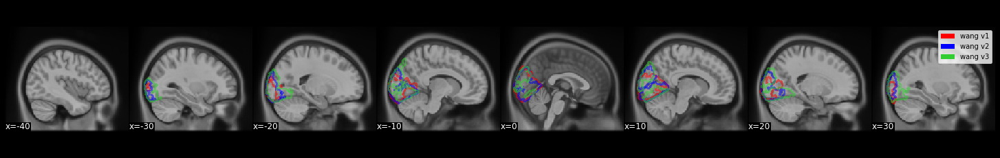

In [294]:
# plot these ROIs onto the brain
fig = plt.figure(figsize=(20,3), facecolor="k")
display = plotting.plot_anat(
    tpl_t1w, display_mode="x", cut_coords=list(range(-40,40,10)), figure=fig
)
masks = [v1_wang, v2_wang, v3_wang]
colors = ["red", "blue","limegreen"]#, ,'orange']
for mask, color in zip(masks, colors):
    display.add_contours(
        mask,
        contours=1,
        antialiased=False,
        alpha=0.5,
        linewidth=4.0,
        levels=[0],
        colors=[color],
    )
p1 = Rectangle((0,0), 1, 1, fc="red")
p2 = Rectangle((0,0), 1, 1, fc="blue")
p3 = Rectangle((0,0), 1, 1, fc="limegreen")
p4 = Rectangle((0,0), 1, 1, fc="orange")
plt.legend([p1, p2, p3], ["wang v1", "wang v2", "wang v3"], loc="best")

plt.show()

In [295]:
## Parietal

In [263]:
# load roi from wang atlas
ips0_lh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_IPS0_lh_maxprob.nii')
ips1_lh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_IPS1_lh_maxprob.nii')
ips2_lh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_IPS2_lh_maxprob.nii')
ips3_lh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_IPS3_lh_maxprob.nii')
ips4_lh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_IPS4_lh_maxprob.nii')
ips5_lh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_IPS5_lh_maxprob.nii')
spl1_lh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_SPL1_lh_maxprob.nii')

ips0_rh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_IPS0_rh_maxprob.nii')
ips1_rh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_IPS1_rh_maxprob.nii')
ips2_rh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_IPS2_rh_maxprob.nii')
ips3_rh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_IPS3_rh_maxprob.nii')
ips4_rh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_IPS4_rh_maxprob.nii')
ips5_rh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_IPS5_rh_maxprob.nii')
spl1_rh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_SPL1_rh_maxprob.nii')

In [270]:
# we want to combine v1v and v1d for the wang atlas
ips_lh_wang = image.math_img("img1+img2+img3+img4+img5+img6", 
                             img1=ips0_lh_wang,img2=ips1_lh_wang,
                            img3=ips2_lh_wang,img4=ips3_lh_wang,
                            img5=ips4_lh_wang,img6=ips5_lh_wang)
ips_rh_wang = image.math_img("img1+img2+img3+img4+img5+img6", 
                             img1=ips0_rh_wang,img2=ips1_rh_wang,
                            img3=ips2_rh_wang,img4=ips3_rh_wang,
                            img5=ips4_rh_wang,img6=ips5_rh_wang)
ips_wang = image.math_img("img1 + img2", img1=ips_lh_wang,img2=ips_rh_wang)
spl1_wang = image.math_img("img1 + img2", img1=spl1_lh_wang, img2=spl1_rh_wang)

ips012_lh_wang = image.math_img("img1+img2+img3", 
                             img1=ips0_lh_wang,img2=ips1_lh_wang,
                            img3=ips2_lh_wang)
ips345_lh_wang = image.math_img("img1+img2+img3", 
                             img1=ips3_lh_wang,img2=ips4_lh_wang,
                            img3=ips5_lh_wang)
ips012_rh_wang = image.math_img("img1+img2+img3", 
                             img1=ips0_rh_wang,img2=ips1_rh_wang,
                            img3=ips2_rh_wang)
ips345_rh_wang = image.math_img("img1+img2+img3", 
                             img1=ips3_rh_wang,img2=ips4_rh_wang,
                            img3=ips5_rh_wang)
ips012_wang = image.math_img("img1 + img2", img1=ips012_lh_wang,img2=ips012_rh_wang)
ips345_wang = image.math_img("img1 + img2", img1=ips345_lh_wang,img2=ips345_rh_wang)

ips012spl1_wang = image.math_img("img1 + img2", img1=ips012_wang,img2=spl1_wang)


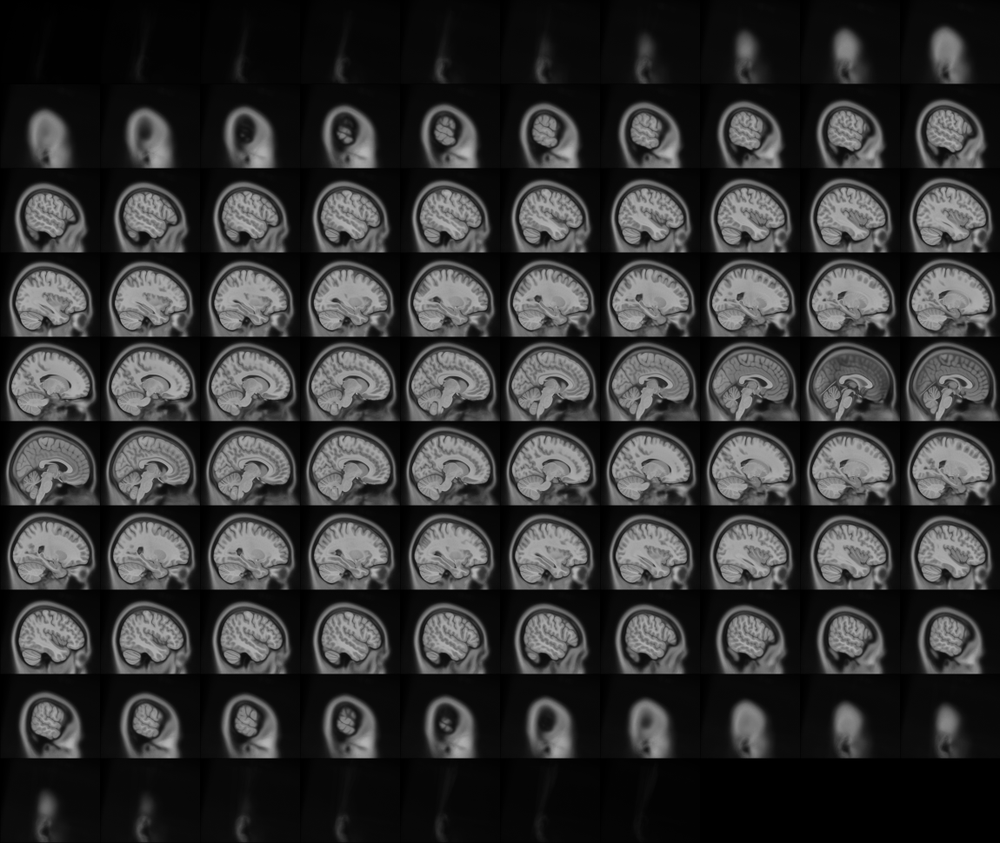
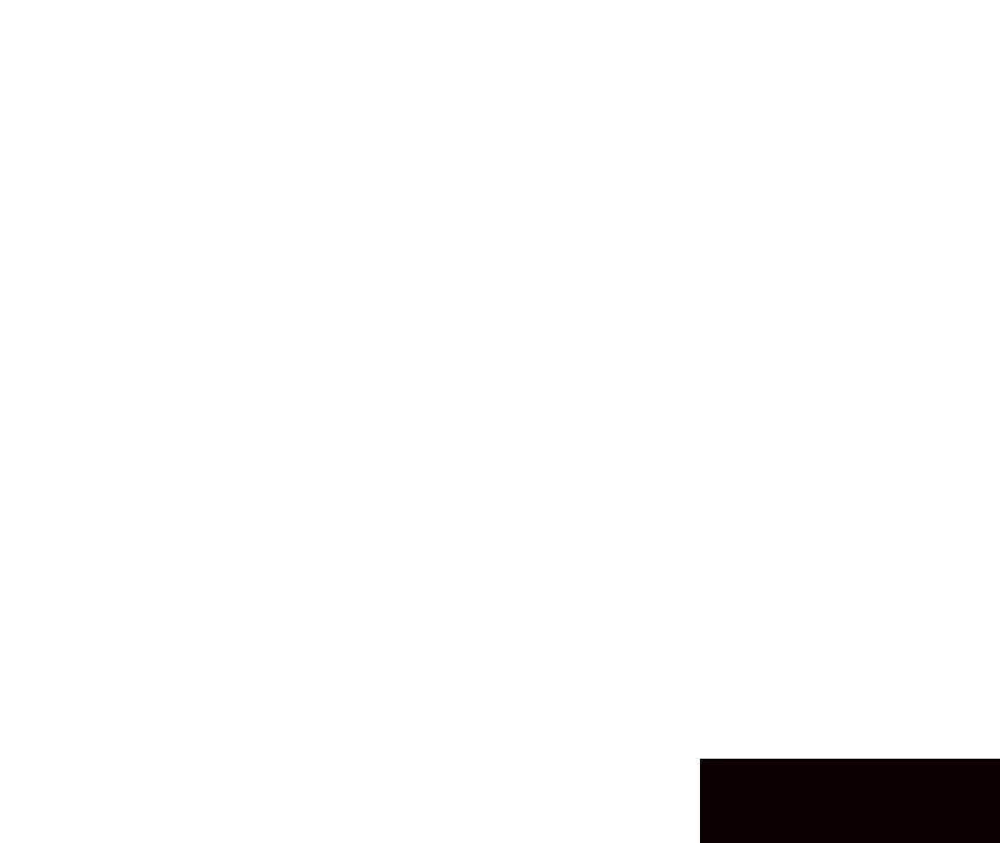

In [129]:
plotting.view_img(lparietal_aal,tpl_t1w, title="Lateral parietal aal")
# middle occipital
# x: -64, 64
# y: -12, -80
# z: 24, 62


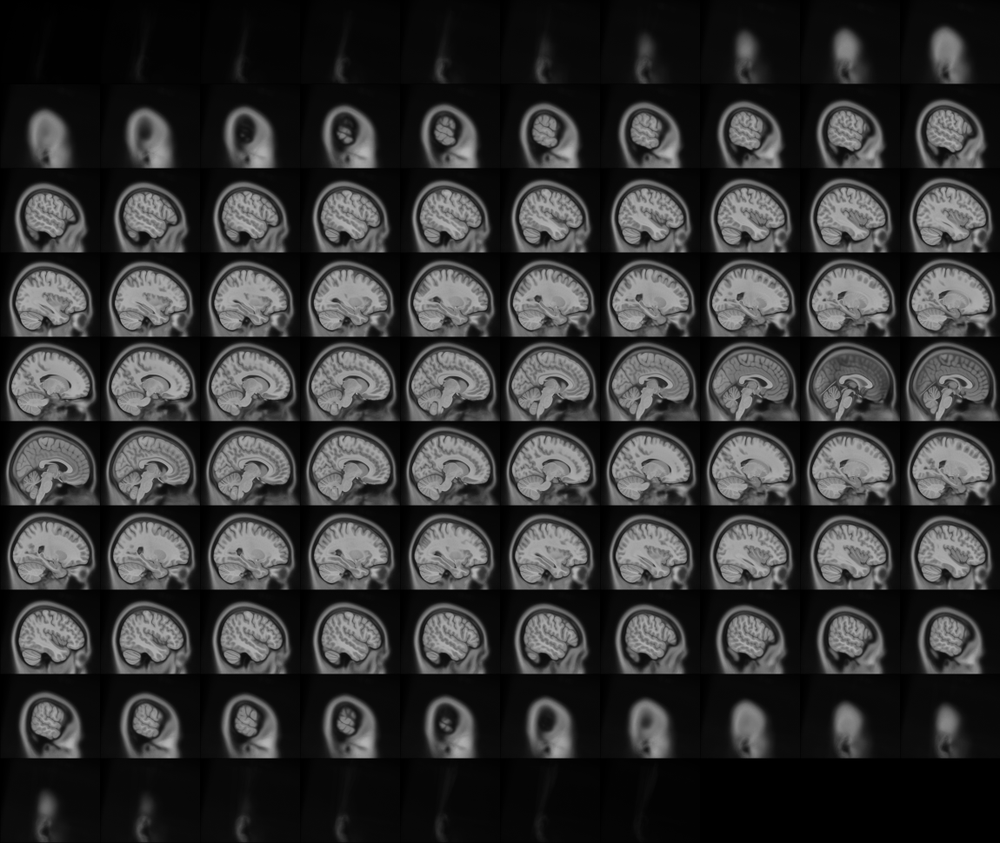
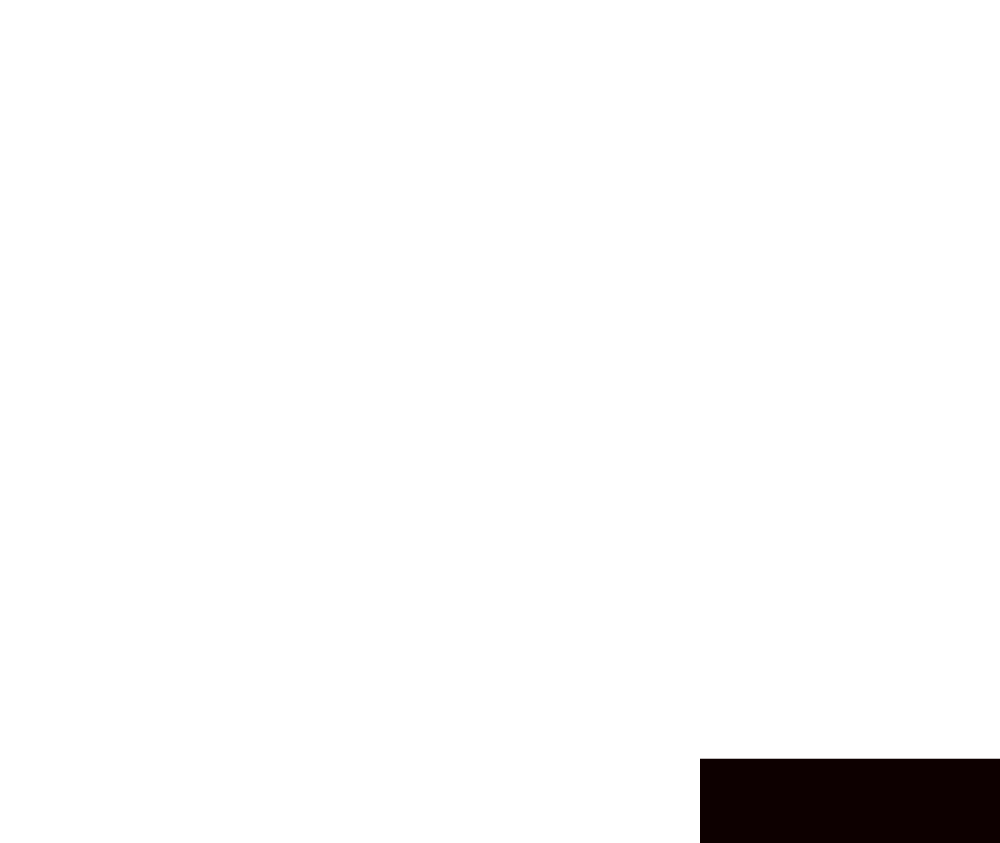

In [269]:
plotting.view_img(ips345_wang,tpl_t1w, title="")

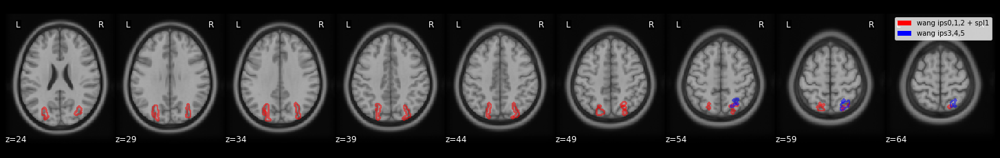

In [276]:
# plot these ROIs onto the brain
fig = plt.figure(figsize=(20,3), facecolor="k")
display = plotting.plot_anat(
    tpl_t1w, display_mode="z", cut_coords=list(range(24,65,5)), figure=fig
)
masks = [ips012spl1_wang, ips345_wang]#, spl1_wang]
colors = ["red", "blue"]#, "limegreen"] #,'orange'
for mask, color in zip(masks, colors):
    display.add_contours(
        mask,
        contours=1,
        antialiased=False,
        alpha=0.5,
        linewidth=4.0,
        levels=[0],
        colors=[color],
    )
p1 = Rectangle((0,0), 1, 1, fc="red")
p2 = Rectangle((0,0), 1, 1, fc="blue")
p3 = Rectangle((0,0), 1, 1, fc="limegreen")
p4 = Rectangle((0,0), 1, 1, fc="orange")
plt.legend([p1, p2], ["wang ips0,1,2 + spl1", "wang ips3,4,5"], loc="best") #, "wang spl" , p3

plt.show()

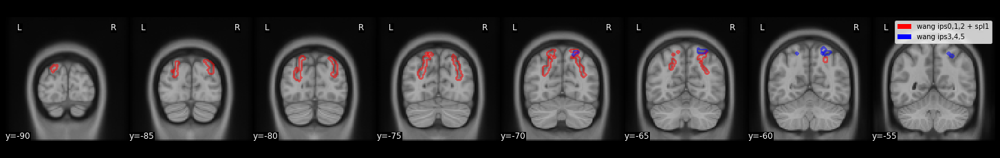

In [278]:
# plot these ROIs onto the brain
fig = plt.figure(figsize=(20,3), facecolor="k")
display = plotting.plot_anat(
    tpl_t1w, display_mode="y", cut_coords=list(range(-90,-50,5)), figure=fig
)
masks = [ips012spl1_wang, ips345_wang]#, spl1_wang]
colors = ["red", "blue"]#, "limegreen"] #,'orange'
for mask, color in zip(masks, colors):
    display.add_contours(
        mask,
        contours=1,
        antialiased=False,
        alpha=0.5,
        linewidth=4.0,
        levels=[0],
        colors=[color],
    )
p1 = Rectangle((0,0), 1, 1, fc="red")
p2 = Rectangle((0,0), 1, 1, fc="blue")
p3 = Rectangle((0,0), 1, 1, fc="limegreen")
p4 = Rectangle((0,0), 1, 1, fc="orange")
plt.legend([p1, p2], ["wang ips0,1,2 + spl1", "wang ips3,4,5"], loc="best") #, "wang spl" , p3

plt.show()

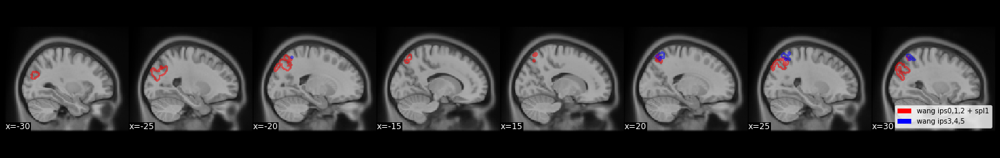

In [284]:
# plot these ROIs onto the brain
fig = plt.figure(figsize=(20,3), facecolor="k")
display = plotting.plot_anat(
    tpl_t1w, display_mode="x", cut_coords=[-30,-25,-20,-15,15,20,25,30], figure=fig
)
masks = [ips012spl1_wang, ips345_wang]#, spl1_wang]
colors = ["red", "blue"]#, "limegreen"] #,'orange'
for mask, color in zip(masks, colors):
    display.add_contours(
        mask,
        contours=1,
        antialiased=False,
        alpha=0.5,
        linewidth=4.0,
        levels=[0],
        colors=[color],
    )
p1 = Rectangle((0,0), 1, 1, fc="red")
p2 = Rectangle((0,0), 1, 1, fc="blue")
p3 = Rectangle((0,0), 1, 1, fc="limegreen")
p4 = Rectangle((0,0), 1, 1, fc="orange")
plt.legend([p1, p2], ["wang ips0,1,2 + spl1", "wang ips3,4,5"], loc="lower right") #, "wang spl" , p3

plt.show()

In [ ]:
# fef

In [285]:
# load roi from wang atlas
fef_lh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_FEF_lh_maxprob.nii')
fef_rh_wang = nib.load('atlases/VisualProbAtlas_v4/subj_vol_all/2mm_FEF_rh_maxprob.nii')
fef_wang = image.math_img("img1 + img2", img1=fef_lh_wang, img2=fef_rh_wang)

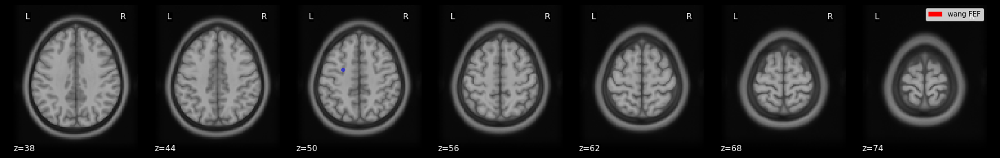

In [286]:
# plot these ROIs onto the brain
fig = plt.figure(figsize=(20,3), facecolor="k")
display = plotting.plot_anat(
    tpl_t1w, display_mode="z", cut_coords=list(range(38,80,6)), figure=fig
)
masks = [fef_wang]
colors = ["blue"]#,'orange']
for mask, color in zip(masks, colors):
    display.add_contours(
        mask,
        contours=1,
        antialiased=False,
        alpha=0.5,
        linewidth=4.0,
        levels=[0],
        colors=[color],
    )
p1 = Rectangle((0,0), 1, 1, fc="red")
p2 = Rectangle((0,0), 1, 1, fc="blue")
p3 = Rectangle((0,0), 1, 1, fc="limegreen")
p4 = Rectangle((0,0), 1, 1, fc="orange")
plt.legend([p1], ["wang FEF"], loc="best")

plt.show()

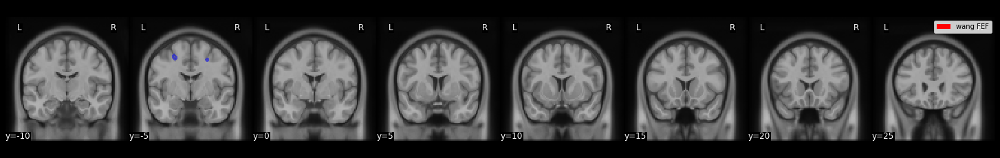

In [287]:
# plot these ROIs onto the brain
fig = plt.figure(figsize=(20,3), facecolor="k")
display = plotting.plot_anat(
    tpl_t1w, display_mode="y", cut_coords=list(range(-10, 30,5)), figure=fig
)
masks = [fef_wang]
colors = ["blue"]#,'orange']
for mask, color in zip(masks, colors):
    display.add_contours(
        mask,
        contours=1,
        antialiased=False,
        alpha=0.5,
        linewidth=4.0,
        levels=[0],
        colors=[color],
    )
p1 = Rectangle((0,0), 1, 1, fc="red")
p2 = Rectangle((0,0), 1, 1, fc="blue")
p3 = Rectangle((0,0), 1, 1, fc="limegreen")
p4 = Rectangle((0,0), 1, 1, fc="orange")
plt.legend([p1], ["wang FEF"], loc="best")

plt.show()

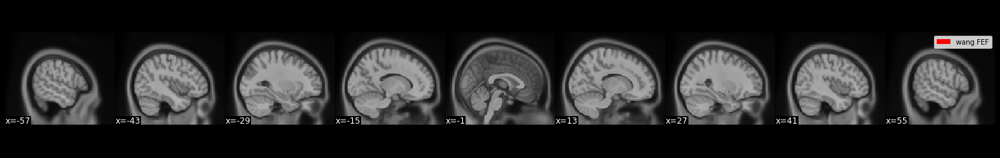

In [290]:
# plot these ROIs onto the brain
fig = plt.figure(figsize=(20,3), facecolor="k")
display = plotting.plot_anat(
    tpl_t1w, display_mode="x", cut_coords=list(range(-57,57,14)), figure=fig
)
masks = [fef_wang]
colors = ["blue"]#,'orange']
for mask, color in zip(masks, colors):
    display.add_contours(
        mask,
        contours=1,
        antialiased=False,
        alpha=0.5,
        linewidth=4.0,
        levels=[0],
        colors=[color],
    )
p1 = Rectangle((0,0), 1, 1, fc="red")
p2 = Rectangle((0,0), 1, 1, fc="blue")
p3 = Rectangle((0,0), 1, 1, fc="limegreen")
p4 = Rectangle((0,0), 1, 1, fc="orange")
plt.legend([p1], ["wang FEF"], loc="best")

plt.show()